# ***Telecom Churn Case Study***

## **Problem Statement**

#### ***Business problem overview***<br>
In the telecom industry, customers are able to choose from multiple service providers and actively switch from one operator to another. In this highly competitive market, the telecommunications industry experiences an average of 15-25% annual churn rate. Given the fact that it costs 5-10 times more to acquire a new customer than to retain an existing one, **customer retention** has now become even more important than customer acquisition.

 

For many incumbent operators, retaining high profitable customers is the number one business goal.

 

To reduce customer churn, telecom companies need to **predict which customers are at high risk of churn.**

 

In this project, you will analyse customer-level data of a leading telecom firm, build predictive models to identify customers at high risk of churn and identify the main indicators of churn.

 

#### ***Understanding and defining churn***<br>
There are two main models of payment in the telecom industry - **`postpaid`** (customers pay a monthly/annual bill after using the services) and **`prepaid`** (customers pay/recharge with a certain amount in advance and then use the services).

 

In the postpaid model, when customers want to switch to another operator, they usually inform the existing operator to terminate the services, and you directly know that this is an instance of churn.

 

However, in the prepaid model, customers who want to switch to another network can simply stop using the services without any notice, and it is hard to know whether someone has actually churned or is simply not using the services temporarily (e.g. someone may be on a trip abroad for a month or two and then intend to resume using the services again).

 

Thus, churn prediction is usually more critical (and non-trivial) for prepaid customers, and the term ‘churn’ should be defined carefully.  Also, prepaid is the most common model in India and Southeast Asia, while postpaid is more common in Europe in North America.

 

*This project is based on the Indian and Southeast Asian market.*

 

#### ***Definitions of churn***<br>
There are various ways to define churn, such as:

**`Revenue-based churn`**: Customers who have not utilised any revenue-generating facilities such as mobile internet, outgoing calls, SMS etc. over a given period of time. One could also use aggregate metrics such as ‘customers who have generated less than INR 4 per month in total/average/median revenue’.

 

The main shortcoming of this definition is that there are customers who only receive calls/SMSes from their wage-earning counterparts, i.e. they don’t generate revenue but use the services. For example, many users in rural areas only receive calls from their wage-earning siblings in urban areas.

 

**`Usage-based churn`**: Customers who have not done any usage, either incoming or outgoing - in terms of calls, internet etc. over a period of time.

 

A potential shortcoming of this definition is that when the customer has stopped using the services for a while, it may be too late to take any corrective actions to retain them. For e.g., if you define churn based on a ‘two-months zero usage’ period, predicting churn could be useless since by that time the customer would have already switched to another operator.

 

In this project, you will use the **`usage-based definition`** to define churn.

 

#### ***High-value churn***<br>
In the Indian and the Southeast Asian market, approximately 80% of revenue comes from the top 20% customers (called high-value customers). Thus, if we can reduce churn of the high-value customers, we will be able to reduce significant revenue leakage.

 

In this project, you will define high-value customers based on a certain metric (mentioned later below) and predict churn only on high-value customers.

 

#### ***Understanding the business objective and the data***<br>
The dataset contains customer-level information for a span of four consecutive months - June, July, August and September. The months are encoded as 6, 7, 8 and 9, respectively. 


The business objective is to predict the churn in the last (i.e. the ninth) month using the data (features) from the first three months. To do this task well, understanding the typical customer behaviour during churn will be helpful.

 

#### ***Understanding customer behaviour during churn***
Customers usually do not decide to switch to another competitor instantly, but rather over a period of time (this is especially applicable to high-value customers). In churn prediction, we assume that there are **`three phases of customer lifecycle`** :

- The ***`‘good’`*** phase: In this phase, the customer is happy with the service and behaves as usual.

- The ***`‘action’`*** phase: The customer experience starts to sore in this phase, for e.g. he/she gets a compelling offer from a  competitor, faces unjust charges, becomes unhappy with service quality etc. In this phase, the customer usually shows different behaviour than the ‘good’ months. Also, it is crucial to identify high-churn-risk customers in this phase, since some corrective actions can be taken at this point (such as matching the competitor’s offer/improving the service quality etc.)

- The ***`‘churn’`*** phase: In this phase, the customer is said to have churned. You define churn based on this phase. Also, it is important to note that at the time of prediction (i.e. the action months), this data is not available to you for prediction. Thus, after **`tagging churn as 1/0 based on this phase`**, you discard all data corresponding to this phase.

 

In this case, since you are working over a four-month window, the first two months are the ‘good’ phase, the third month is the ‘action’ phase, while the fourth month is the ‘churn’ phase.

### Importing Libraries

In [1]:
# Basic libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import time

# Supressing the warnings generated
import warnings
warnings.filterwarnings('ignore')

# Importing Pandas EDA tool
import pandas_profiling as pp
from pandas_profiling import ProfileReport

# Displaying all Columns without restrictions
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
pd.set_option('display.max_colwidth', -1)

### Importing the Dataset

In [2]:
# Reading the csv data file.
telecom_data = pd.read_csv("telecom_churn_data.csv")

In [3]:
# Displaying the first 10 field with all columns in the dataset
telecom_data.head(10)

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
0,7000842753,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,197.385,214.816,213.803,21.100,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,0.00,0.00,0.00,0.00,NaN,NaN,0.16,NaN,NaN,NaN,4.13,NaN,NaN,NaN,1.15,NaN,NaN,NaN,5.44,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,0.00,0.00,5.44,0.00,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,

In [4]:
telecom_data.shape

(99999, 226)

In [5]:
telecom_data.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99999 entries, 0 to 99998
Data columns (total 226 columns):
 #    Column                    Dtype  
---   ------                    -----  
 0    mobile_number             int64  
 1    circle_id                 int64  
 2    loc_og_t2o_mou            float64
 3    std_og_t2o_mou            float64
 4    loc_ic_t2o_mou            float64
 5    last_date_of_month_6      object 
 6    last_date_of_month_7      object 
 7    last_date_of_month_8      object 
 8    last_date_of_month_9      object 
 9    arpu_6                    float64
 10   arpu_7                    float64
 11   arpu_8                    float64
 12   arpu_9                    float64
 13   onnet_mou_6               float64
 14   onnet_mou_7               float64
 15   onnet_mou_8               float64
 16   onnet_mou_9               float64
 17   offnet_mou_6              float64
 18   offnet_mou_7              float64
 19   offnet_mou_8              float64
 20   offn

##### This telecom dataset has 99999 rows and 226 columns

### Checking the terms used in the data from data dictionary provided.

In [6]:
# Importing the excel file of the dictionary.
telecom_data_dict = pd.read_excel("Data+Dictionary-+Telecom+Churn+Case+Study.xlsx")

In [7]:
# Displaying the dictionary items
telecom_data_dict

,Acronyms,Descriptions
0,MOBILE_NUMBER,Customer phone number
1,CIRCLE_ID,Telecom circle area to which the customer belongs to
2,LOC,Local calls - within same telecom circle
3,STD,STD calls - outside the calling circle
4,IC,Incoming calls
5,OG,Outgoing calls
6,T2T,"Operator T to T, i.e. within same operator (mobile to mobile)"
7,T2M,Operator T to other operator mobile
8,T2O,Operator T to other operator fixed line
9,T2F,Operator T to fixed lines of T


<br>

### Initial Statistical Analysis of the Data

In [8]:
# Statistical analysis of the numercial features
telecom_data.describe().T

,count,mean,std,min,25%,50%,75%,max
mobile_number,99999.0,7.001207e+09,695669.386290,7.000000e+09,7.000606e+09,7.001205e+09,7.001812e+09,7.002411e+09
circle_id,99999.0,1.090000e+02,0.000000,1.090000e+02,1.090000e+02,1.090000e+02,1.090000e+02,1.090000e+02
loc_og_t2o_mou,98981.0,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
std_og_t2o_mou,98981.0,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
loc_ic_t2o_mou,98981.0,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
arpu_6,99999.0,2.829874e+02,328.439770,-2.258709e+03,9.341150e+01,1.977040e+02,3.710600e+02,2.773109e+04
arpu_7,99999.0,2.785366e+02,338.156291,-2.014045e+03,8.698050e+01,1.916400e+02,3.653445e+02,3.514583e+04
arpu_8,99999.0,2.791547e+02,344.474791,-9.458080e+02,8.412600e+01,1.920800e+02,3.693705e+02,3.354362e+04
arpu_9,99999.0,2.616451e+02,341.998630,-1.899505e+03,6.268500e+01,1.768490e+02,3.534665e+02,3.880562e+04
onnet_mou_6,96062.0,1.323959e+02,297.207406,0.000000e+00,7.380000e+00,3.431000e+01,1.187400e+02,7.376710e+03


In [9]:
# Checkng the overall missing values in the data
((telecom_data.isnull().sum()/telecom_data.shape[0])*100).round(2)

mobile_number               0.00 
circle_id                   0.00 
loc_og_t2o_mou              1.02 
std_og_t2o_mou              1.02 
loc_ic_t2o_mou              1.02 
last_date_of_month_6        0.00 
last_date_of_month_7        0.60 
last_date_of_month_8        1.10 
last_date_of_month_9        1.66 
arpu_6                      0.00 
arpu_7                      0.00 
arpu_8                      0.00 
arpu_9                      0.00 
onnet_mou_6                 3.94 
onnet_mou_7                 3.86 
onnet_mou_8                 5.38 
onnet_mou_9                 7.75 
offnet_mou_6                3.94 
offnet_mou_7                3.86 
offnet_mou_8                5.38 
offnet_mou_9                7.75 
roam_ic_mou_6               3.94 
roam_ic_mou_7               3.86 
roam_ic_mou_8               5.38 
roam_ic_mou_9               7.75 
roam_og_mou_6               3.94 
roam_og_mou_7               3.86 
roam_og_mou_8               5.38 
roam_og_mou_9               7.75 
loc_og_t2t_mou

### Let us start with handling the missing values for each column applicable

*From the statistical analysis, it can be seen that the columns mentioned below does not contain any value apart from 0, and no information gained from them. Hence these columns can be considered highly skewed and can be droped from the dataset.*

* `'loc_og_t2o_mou'`
* `'std_og_t2o_mou'`
* `'loc_ic_t2o_mou'`

In [10]:
# Dropping the above mentioned columns
cols=['loc_og_t2o_mou','std_og_t2o_mou','loc_ic_t2o_mou']
telecom_data.drop(cols,axis=1,inplace=True)

*As the columns `'last_date_of_month_7'`, `'last_date_of_month_8'`, `'last_date_of_month_9'`  indicates the last day of the month, we can simply use the mode method to replace the missing values in these three columns*

In [11]:
# Replacing the null values using the mode() method for column 'last_date_of_month_7'
telecom_data['last_date_of_month_7'].fillna(telecom_data['last_date_of_month_7'].mode()[0], inplace=True)

# Replacing the null values using the mode() method for column 'last_date_of_month_8'
telecom_data['last_date_of_month_8'].fillna(telecom_data['last_date_of_month_8'].mode()[0], inplace=True)

# Replacing the null values using the mode() method for column 'last_date_of_month_9'
telecom_data['last_date_of_month_9'].fillna(telecom_data['last_date_of_month_9'].mode()[0], inplace=True)

### Handling missing values of meaningful attribute column

- ### *Handling missing values with respect to `data recharge` attributes*

In [12]:
telecom_data[['date_of_last_rech_data_6','total_rech_data_6','max_rech_data_6']].head(10)

,date_of_last_rech_data_6,total_rech_data_6,max_rech_data_6
0,6/21/2014,1.0,252.0
1,NaN,NaN,NaN
2,NaN,NaN,NaN
3,NaN,NaN,NaN
4,6/4/2014,1.0,56.0
5,NaN,NaN,NaN
6,NaN,NaN,NaN
7,NaN,NaN,NaN
8,NaN,NaN,NaN
9,NaN,NaN,NaN


* Let us conside the column `date_of_last_rech_data` indicating the date of the last recharge made in any given month for mobile internet. Here it can deduced if the `total_rech_data` and the `max_rech_data` also has missing values, the missing values in all the columns mentioned can be considered as meaningful missing.<br> 
* Hence imputing 0 as their values.<br>
* Meaningfull missing in this case represents the the customer has not done any recharge for mobile interenet.

#### Handling the missing values for the attributes `total_rech_data_*`, `max_rech_data_*` and `date_of_last_rech_data_*` for month 6,7,8 and 9

In [13]:
# Code for conditional imputation
start_time=time.time()
for i in range(len(telecom_data)):
  # Handling 'total_rech_data', 'max_rech_data' and 'date_of_last_rech_data' for month 6
    if pd.isnull((telecom_data['total_rech_data_6'][i]) and (telecom_data['max_rech_data_6'][i])):
        if pd.isnull(telecom_data['date_of_last_rech_data_6'][i]):
            telecom_data['date_of_last_rech_data_6'][i]=0
            telecom_data['total_rech_data_6'][i]=0
            telecom_data['max_rech_data_6'][i]=0

  # Handling 'total_rech_data', 'max_rech_data' and 'date_of_last_rech_data' for month 7
    if pd.isnull((telecom_data['total_rech_data_7'][i]) and (telecom_data['max_rech_data_7'][i])):
        if pd.isnull(telecom_data['date_of_last_rech_data_7'][i]):
            telecom_data['date_of_last_rech_data_7'][i]=0
            telecom_data['total_rech_data_7'][i]=0
            telecom_data['max_rech_data_7'][i]=0

  # Handling 'total_rech_data', 'max_rech_data' and 'date_of_last_rech_data' for month 8
    if pd.isnull((telecom_data['total_rech_data_8'][i]) and (telecom_data['max_rech_data_8'][i])):
        if pd.isnull(telecom_data['date_of_last_rech_data_8'][i]):
            telecom_data['date_of_last_rech_data_8'][i]=0
            telecom_data['total_rech_data_8'][i]=0
            telecom_data['max_rech_data_8'][i]=0

  # Handling 'total_rech_data', 'max_rech_data' and 'date_of_last_rech_data' for month 9
    if pd.isnull((telecom_data['total_rech_data_9'][i]) and (telecom_data['max_rech_data_9'][i])):
        if pd.isnull(telecom_data['date_of_last_rech_data_9'][i]):
            telecom_data['date_of_last_rech_data_9'][i]=0
            telecom_data['total_rech_data_9'][i]=0
            telecom_data['max_rech_data_9'][i]=0

end_time = time.time()
print(end_time-start_time)

1111.6899716854095


#### Handling the missing values for the attributes `count_rech_2g_*`,`count_rech_3g_*` for month 6,7,8 and 9

In [14]:
# Checking the related columns values
telecom_data[['count_rech_2g_6','count_rech_3g_6','total_rech_data_6']].head(10)

,count_rech_2g_6,count_rech_3g_6,total_rech_data_6
0,0.0,1.0,1.0
1,NaN,NaN,0.0
2,NaN,NaN,0.0
3,NaN,NaN,0.0
4,1.0,0.0,1.0
5,NaN,NaN,0.0
6,NaN,NaN,0.0
7,NaN,NaN,0.0
8,NaN,NaN,0.0
9,NaN,NaN,0.0


*From the above tablular the column values of `total_rech_data` for each month from 6 to 9 respectively is the sum of the columns values of `count_rech_2g` for each month from 6 to 9 respectively and `count_rech_3g` for each month from 6 to 9 respectively, which derives to a multicollinearity issue. In order to reduce the multicollinearity, we can drop the columns `count_rech_2g` for each month from 6 to 9 respectively and `count_rech_3g` for each month from 6 to 9 respectively.*

In [15]:
# Dropping the columns 'count_rech_2g_*' & 'count_rech_3g_*' for the months 6,7,8 and 9 
telecom_data.drop(['count_rech_2g_6','count_rech_3g_6',
                   'count_rech_2g_7','count_rech_3g_7',
                   'count_rech_2g_8','count_rech_3g_8',
                   'count_rech_2g_9','count_rech_3g_9'],axis=1, inplace=True)

#### Handling the missing values for the attributes `av_rech_amt_data_*` for month 6,7,8 and 9

In [16]:
# Checking the related columns values
telecom_data[['av_rech_amt_data_7','max_rech_data_7','total_rech_data_7']].head(10)

,av_rech_amt_data_7,max_rech_data_7,total_rech_data_7
0,252.0,252.0,1.0
1,154.0,154.0,1.0
2,NaN,0.0,0.0
3,NaN,0.0,0.0
4,NaN,0.0,0.0
5,NaN,0.0,0.0
6,NaN,0.0,0.0
7,NaN,0.0,0.0
8,177.0,154.0,2.0
9,154.0,154.0,1.0


From the above tabular it is deduced that the missing values for the column `av_rech_amt_data` for each month from 6 to 9 can be replaced as 0 if the `total_rech_data` for each month from 6 to 9 respectively is 0. i.e. if the total recharge done is 0 then the average recharge amount shall also be 0.

In [17]:
# Code for conditional imputation
start_time=time.time()
for i in range(len(telecom_data)):
  # Handling `av_rech_amt_data`  for month 6
    if (pd.isnull(telecom_data['av_rech_amt_data_6'][i]) and (telecom_data['total_rech_data_6'][i]==0)):
        telecom_data['av_rech_amt_data_6'][i] = 0

  # Handling `av_rech_amt_data`  for month 7
    if (pd.isnull(telecom_data['av_rech_amt_data_7'][i]) and (telecom_data['total_rech_data_7'][i]==0)):
        telecom_data['av_rech_amt_data_7'][i] = 0

  # Handling `av_rech_amt_data`  for month 8
    if (pd.isnull(telecom_data['av_rech_amt_data_8'][i]) and (telecom_data['total_rech_data_8'][i]==0)):
        telecom_data['av_rech_amt_data_8'][i] = 0

  # Handling `av_rech_amt_data`  for month 9
    if (pd.isnull(telecom_data['av_rech_amt_data_9'][i]) and (telecom_data['total_rech_data_9'][i]==0)):
        telecom_data['av_rech_amt_data_9'][i] = 0
      
end_time=time.time()
print(end_time-start_time)

316.46591234207153


#### Handling the missing values for the attributes `arpu_3g_*`,`arpu_2g_*` for month 6,7,8 and 9

In [18]:
# Checking the related columns values
telecom_data[['arpu_3g_6','arpu_2g_6','av_rech_amt_data_6']].head(10)

,arpu_3g_6,arpu_2g_6,av_rech_amt_data_6
0,212.17,212.17,252.0
1,NaN,NaN,0.0
2,NaN,NaN,0.0
3,NaN,NaN,0.0
4,0.00,0.00,56.0
5,NaN,NaN,0.0
6,NaN,NaN,0.0
7,NaN,NaN,0.0
8,NaN,NaN,0.0
9,NaN,NaN,0.0


In [19]:
# Checking the correlation between the above mentioned columns in tabular for months 6,7,8 and 9
print("Correlation table for month 6\n\n", telecom_data[['arpu_3g_6','arpu_2g_6','av_rech_amt_data_6']].corr())
print("\nCorrelation table for month 7\n\n", telecom_data[['arpu_3g_7','arpu_2g_7','av_rech_amt_data_7']].corr())
print("\nCorrelation table for month 8\n\n", telecom_data[['arpu_3g_8','arpu_2g_8','av_rech_amt_data_8']].corr())
print("\nCorrelation table for month 9\n\n", telecom_data[['arpu_3g_9','arpu_2g_9','av_rech_amt_data_9']].corr())

Correlation table for month 6

                     arpu_3g_6  arpu_2g_6  av_rech_amt_data_6
arpu_3g_6           1.000000   0.932232   0.809695          
arpu_2g_6           0.932232   1.000000   0.834065          
av_rech_amt_data_6  0.809695   0.834065   1.000000          

Correlation table for month 7

                     arpu_3g_7  arpu_2g_7  av_rech_amt_data_7
arpu_3g_7           1.000000   0.930366   0.796131          
arpu_2g_7           0.930366   1.000000   0.815933          
av_rech_amt_data_7  0.796131   0.815933   1.000000          

Correlation table for month 8

                     arpu_3g_8  arpu_2g_8  av_rech_amt_data_8
arpu_3g_8           1.000000   0.924925   0.787165          
arpu_2g_8           0.924925   1.000000   0.805482          
av_rech_amt_data_8  0.787165   0.805482   1.000000          

Correlation table for month 9

                     arpu_3g_9  arpu_2g_9  av_rech_amt_data_9
arpu_3g_9           1.000000   0.852253   0.722932          
arpu_2g_9      

From the above correlation table between attributes `arpu_2g_*` and `arpu_3g_*` for each month from 6 to 9 respectively is highly correlated to the attribute `av_rech_amt_data_*` for each month from 6 to 9 respectively.<br> Considering the high correlation between them, it is safer to drop the attributes `arpu_2g_*` and `arpu_3g_*`.

In [20]:
# Dropping the columns 'arpu_3g_6'&'arpu_2g_6' in the sixth month data
telecom_data.drop(['arpu_3g_6','arpu_2g_6'],axis=1, inplace=True)

# Dropping the columns 'arpu_3g_7'&'arpu_2g_7' in the seventh month data
telecom_data.drop(['arpu_3g_7','arpu_2g_7'],axis=1, inplace=True)

# Dropping the columns 'arpu_3g_8'&'arpu_2g_8' in the eigth month data
telecom_data.drop(['arpu_3g_8','arpu_2g_8'],axis=1, inplace=True)

# Dropping the columns 'arpu_3g_9'&'arpu_2g_9' in the ninth month data
telecom_data.drop(['arpu_3g_9','arpu_2g_9'],axis=1, inplace=True)

### Handling the other attributes with higher missing value percentage

The column `fb_user_*` for each month from 6 to 9 respectively has a missing values above 50% and does not seem to add any information to understand the data. Hence we can drop these columns for further analysis.

In [21]:
telecom_data.drop(['fb_user_6','fb_user_7','fb_user_8','fb_user_9'], axis=1, inplace=True)

The column `night_pck_user_*` for each month from 6 to 9 respectively has a missing values above 50% and does not seem to add any information to understand the data. Hence we can drop these columns for further analysis of the data..

In [22]:
telecom_data.drop(['night_pck_user_6','night_pck_user_7','night_pck_user_8','night_pck_user_9'],
                  axis=1, inplace=True)

In [23]:
# Checking for higher missing values columns if any
((telecom_data.isnull().sum()/telecom_data.shape[0])*100).round(2)

mobile_number               0.00
circle_id                   0.00
last_date_of_month_6        0.00
last_date_of_month_7        0.00
last_date_of_month_8        0.00
last_date_of_month_9        0.00
arpu_6                      0.00
arpu_7                      0.00
arpu_8                      0.00
arpu_9                      0.00
onnet_mou_6                 3.94
onnet_mou_7                 3.86
onnet_mou_8                 5.38
onnet_mou_9                 7.75
offnet_mou_6                3.94
offnet_mou_7                3.86
offnet_mou_8                5.38
offnet_mou_9                7.75
roam_ic_mou_6               3.94
roam_ic_mou_7               3.86
roam_ic_mou_8               5.38
roam_ic_mou_9               7.75
roam_og_mou_6               3.94
roam_og_mou_7               3.86
roam_og_mou_8               5.38
roam_og_mou_9               7.75
loc_og_t2t_mou_6            3.94
loc_og_t2t_mou_7            3.86
loc_og_t2t_mou_8            5.38
loc_og_t2t_mou_9            7.75
loc_og_t2m

### Imputation of missing values for numerical column

*** The remaining attributes with missing value can be imputed using the `KNN imputer`.***

For using the KNN imputer we must condition the data as following:
- The data shoud be scaled. Here we can use MinMax Scaler technique
- the categorical column values must be encoded if any.

In [24]:
# Let us check the unique values for the columns to filter out further before scaling
telecom_data.nunique().sort_values(ascending=True)

std_ic_t2o_mou_9            1    
std_ic_t2o_mou_8            1    
std_og_t2c_mou_8            1    
std_og_t2c_mou_9            1    
std_og_t2c_mou_7            1    
std_ic_t2o_mou_6            1    
std_og_t2c_mou_6            1    
last_date_of_month_6        1    
last_date_of_month_7        1    
std_ic_t2o_mou_7            1    
last_date_of_month_8        1    
last_date_of_month_9        1    
circle_id                   1    
monthly_2g_6                5    
monthly_2g_9                5    
monthly_2g_7                6    
monthly_2g_8                6    
monthly_3g_9                11   
monthly_3g_8                12   
monthly_3g_6                12   
monthly_3g_7                15   
sachet_3g_6                 25   
sachet_3g_9                 27   
sachet_3g_7                 27   
sachet_3g_8                 29   
date_of_last_rech_9         30   
date_of_last_rech_6         30   
date_of_last_rech_8         31   
date_of_last_rech_7         31   
date_of_last_r

These columns contain only one value and the column mobile_number has no meaning in the prediction model sd they are considered skewed columns, these columns can be dropped from the data entirely


In [25]:
# Dropping skewed columns from data
telecom_data.drop(['std_ic_t2o_mou_6','std_og_t2c_mou_8','std_og_t2c_mou_7','std_og_t2c_mou_6','std_ic_t2o_mou_9',
             'std_ic_t2o_mou_8','std_og_t2c_mou_9','last_date_of_month_6','last_date_of_month_7','last_date_of_month_8',
             'last_date_of_month_9','std_ic_t2o_mou_7','circle_id','mobile_number'], inplace=True, axis=1)

In [26]:
 # Segregating the columns by their datatypes
 
 # for Non Numerical columns available
 catg_col = telecom_data.select_dtypes(include = 'object').columns.tolist()

 # for Numerical columns available
 num_col = telecom_data.select_dtypes(include = ['int64','float64']).columns.tolist()

In [27]:
# Importing the libraries for Scaling and Imputation
from sklearn.impute import KNNImputer
from sklearn.preprocessing import MinMaxScaler

# Calling the Scaling function
scalar = MinMaxScaler()

# Scaling and transforming the data for the columns that are numerical
telecom_data[num_col]=scalar.fit_transform(telecom_data[num_col])

In [28]:
# Checking the scaled Output for the numerical columns
telecom_data[num_col].head()

,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
0,0.081898,0.059980,0.033622,0.047183,NaN,NaN,0.000000,NaN,NaN,NaN,0.000000,NaN,NaN,NaN,0.000000,NaN,NaN,NaN,0.000000,NaN,NaN,NaN,0.000000,NaN,NaN,NaN,0.000000,NaN,NaN,NaN,0.000000,NaN,NaN,NaN,0.000000,NaN,NaN,NaN,0.000000,NaN,NaN,NaN,0.000000,NaN,NaN,NaN,0.000000,NaN,NaN,NaN,0.000000,NaN,NaN,NaN,0.000000,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.000000,NaN,NaN,NaN,0.0,NaN,0.000000,0.000000,0.000000,0.000000,NaN,NaN,0.000015,NaN,NaN,NaN,0.000658,NaN,NaN,NaN,0.000473,NaN,NaN,NaN,0.000502,NaN,NaN,NaN,0.000000,NaN,NaN,NaN,0.000000,NaN,NaN,NaN,0.000000,NaN,NaN,NaN,0.000000,NaN,0.000000,0.000000,0.000502,0.000000,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,0.013029,0.021739,0.010204,0.045802,0.010287,0.006248,0.005560,0.000000,0.062843,0.062843,0.056642,0.00000,0.062843,0.062843,0.056642,0.000000,0.016393,0.018519,0.016667,0.000000,0.162058,0.162058,0.162058,0.000000,0.033395,0.057732,0.061825,0.000000,0.002929,0.000168,0.000517,0.0,0.001827,0.005357,0.003649,0.000000,0.0,0.0,0.0,0.0,0.00000,0.0,0.000000,0.000,0.071429,0.0625,0.0625,0.0,0.0,0.0,0.0,0.0,0.189560,0.002354,0.0,0.009063,0.001367
1,0.076451,0.063755,0.035203,0.048785,0.003268,0.009645,0.000714,0.001759,0.001882,0.010328,0.021757,0.005214,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.003713,0.010075,0.000714,0.001765,0.002434,0.016664,0.058827,0.012136,0.000000,0.000000,0.000000,0.000000,0.0,0.003176,0.000000,0.000000,0.003325

In [29]:
# Calling the KNN Imputer function
knn=KNNImputer(n_neighbors=3)

In [30]:
# Imputing the NaN values using KNN Imputer
start_time=time.time()

telecom_data_knn = pd.DataFrame(knn.fit_transform(telecom_data[num_col]))
telecom_data_knn.columns=telecom_data[num_col].columns

end_time=time.time()
print(end_time-start_time)

3615.599240541458


In [31]:
# for any null values after imputation for numerical columns
telecom_data_knn.isnull().sum().sum()

0

In [32]:
# Converting the scaled data back to the original data
telecom_data[num_col]=scalar.inverse_transform(telecom_data_knn)

In [33]:
# Checking the data
telecom_data.head(20)

,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
0,197.385,214.816,213.803,21.100,37.183333,20.373333,0.00,18.660000,13.906667,10.770000,0.00,14.066667,0.000000,0.00,0.00,0.000000,0.00,0.000000,0.00,0.000000,37.183333,20.373333,0.00,18.276667,11.770000,6.206667,0.00,11.990000,0.126667,4.463333,0.00,2.076667,0.00,0.000000,0.00,0.243333,49.083333,31.050000,0.00,32.343333,0.000000,0.00,0.00,0.383333,0.000000,0.093333,0.00,0.00,0.00,0.00,0.00,0.00,0.000000,0.093333,0.00,0.383333,0.0,0.00,0.00,0.0,2.006667,0.326667,0.00,0.663333,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.00,24.606667,6.926667,0.16,7.810000,42.926667,22.020000,4.13,14.293333,5.160000,4.313333,1.15,2.153333,72.706667,33.263333,5.44,24.260000,0.00,3.366667,0.00,0.000000,2.243333,0.453333,0.00,1.086667,0.00,0.00,0.00,0.386667,2.243333,3.82,0.00,1.476667,0.00,0.00,5.44,0.00,0.093333,0.033333,0.00,0.093333,0.00,0.00,0.00,0.00,0.00,0.55,0.00,0.136667,4.0,3.0,2.0,6.0,362.0,252.0,252.0,0.0,252.0,252.0,252.0,0.0,6/21/2014,7/16/2014,8/8/2014,9/28/2014,252.0,252.0,252.0,0.0,6/21/2014,7/16/2014,8/8/2014,0,1.0,1.0,1.0,0.0,252.0,252.0,252.0,0.0,252.0,252.0,252.0,0.0,30.13,1.32,5.75,0.00,83.57,150.76,109.61,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,968.0,30.40,0.00,101.20,3.58
1,34.047,355.074,268.3

In [34]:
# Check for missing values in the data still available
telecom_data.isnull().sum()

arpu_6                      0   
arpu_7                      0   
arpu_8                      0   
arpu_9                      0   
onnet_mou_6                 0   
onnet_mou_7                 0   
onnet_mou_8                 0   
onnet_mou_9                 0   
offnet_mou_6                0   
offnet_mou_7                0   
offnet_mou_8                0   
offnet_mou_9                0   
roam_ic_mou_6               0   
roam_ic_mou_7               0   
roam_ic_mou_8               0   
roam_ic_mou_9               0   
roam_og_mou_6               0   
roam_og_mou_7               0   
roam_og_mou_8               0   
roam_og_mou_9               0   
loc_og_t2t_mou_6            0   
loc_og_t2t_mou_7            0   
loc_og_t2t_mou_8            0   
loc_og_t2t_mou_9            0   
loc_og_t2m_mou_6            0   
loc_og_t2m_mou_7            0   
loc_og_t2m_mou_8            0   
loc_og_t2m_mou_9            0   
loc_og_t2f_mou_6            0   
loc_og_t2f_mou_7            0   
loc_og_t2f

Since we do not have any data to identify the last date of recharge, we can simply assume it as 0 indicating as no recharge done.

In [35]:
# Handling `date_of_last_rech_*`  for month 6,7,8 and 9
telecom_data['date_of_last_rech_6'].fillna(0, inplace=True)
telecom_data['date_of_last_rech_7'].fillna(0, inplace=True)
telecom_data['date_of_last_rech_8'].fillna(0, inplace=True)
telecom_data['date_of_last_rech_9'].fillna(0, inplace=True)

In [36]:
telecom_data[['date_of_last_rech_6','date_of_last_rech_7']].head(50)

,date_of_last_rech_6,date_of_last_rech_7
0,6/21/2014,7/16/2014
1,6/29/2014,7/31/2014
2,6/17/2014,7/24/2014
3,6/28/2014,7/31/2014
4,6/26/2014,7/28/2014
5,6/19/2014,7/17/2014
6,6/28/2014,7/31/2014
7,6/27/2014,7/25/2014
8,6/25/2014,7/31/2014
9,6/29/2014,7/23/2014


In [37]:
# checking for the missing values in the data again
telecom_data.isnull().sum().sum()

0

#### Filtering HVC

In [38]:
 # Filtering the data 
 # We are filtering the data in accordance to total revenue generated per customer.

 # first we need the total amount recharge amount done for data alone, we have average rechage amount done. 

 # Calculating the total recharge amount done for data alone in months 6,7,8 and 9
telecom_data['total_rech_amt_data_6']=telecom_data['av_rech_amt_data_6'] * telecom_data['total_rech_data_6']
telecom_data['total_rech_amt_data_7']=telecom_data['av_rech_amt_data_7'] * telecom_data['total_rech_data_7']
telecom_data['total_rech_amt_data_8']=telecom_data['av_rech_amt_data_8'] * telecom_data['total_rech_data_8']
telecom_data['total_rech_amt_data_9']=telecom_data['av_rech_amt_data_9'] * telecom_data['total_rech_data_9']

In [39]:
# Calculating the overall recharge amount for the months 6,7,8 and 9
telecom_data['overall_rech_amt_6'] = telecom_data['total_rech_amt_data_6'] + telecom_data['total_rech_amt_6']
telecom_data['overall_rech_amt_7'] = telecom_data['total_rech_amt_data_7'] + telecom_data['total_rech_amt_7']
telecom_data['overall_rech_amt_8'] = telecom_data['total_rech_amt_data_8'] + telecom_data['total_rech_amt_8']
telecom_data['overall_rech_amt_9'] = telecom_data['total_rech_amt_data_9'] + telecom_data['total_rech_amt_9']

In [40]:
# calculating the average recharge done by customer in months June and July(i.e. 6th and 7th month)
telecom_data['avg_rech_amt_6_7'] = (telecom_data['overall_rech_amt_6'] + telecom_data['overall_rech_amt_7'])/2

In [41]:
# Finding the value of 70th percentage in the overall revenues defining the high value customer creteria for the company
print(telecom_data['avg_rech_amt_6_7'].quantile(0.70))

478.0


In [42]:
# filtering the data to the top 30% considered as High Value Customer
telecom_data = telecom_data[telecom_data['avg_rech_amt_6_7'] >= telecom_data['avg_rech_amt_6_7'].quantile(.70)]

In [43]:
telecom_data.shape

(30001, 194)

The total number of rows is now limited to ~30k who lies under the High Value customer criteria.

In [44]:
telecom_data.reset_index(inplace=True)
telecom_data.drop(['index'],inplace=True, axis=1)
telecom_data.head()

,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,total_rech_amt_data_6,total_rech_amt_data_7,total_rech_amt_data_8,total_rech_amt_data_9,overall_rech_amt_6,overall_rech_amt_7,overall_rech_amt_8,overall_rech_amt_9,avg_rech_amt_6_7
0,197.385,214.816,213.803,21.100,37.183333,20.373333,0.00,18.660000,13.906667,10.77,0.00,14.066667,0.00,0.00,0.00,0.000000,0.00,0.00,0.00,0.000000,37.183333,20.373333,0.00,18.276667,11.77,6.206667,0.00,11.990000,0.126667,4.463333,0.00,2.076667,0.0,0.0,0.00,0.243333,49.083333,31.05,0.00,32.343333,0.00,0.00,0.00,0.383333,0.00,0.093333,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.093333,0.00,0.383333,0.0,0.00,0.00,0.0,2.006667,0.326667,0.00,0.663333,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,24.606667,6.926667,0.16,7.810000,42.926667,22.02,4.13,14.293333,5.16,4.313333,1.15,2.153333,72.706667,33.263333,5.44,24.260000,0.00,3.366667,0.00,0.000000,2.243333,0.453333,0.00,1.086667,0.00,0.00,0.00,0.386667,2.243333,3.82,0.00,1.476667,0.00,0.00,5.44,0.00,0.093333,0.033333,0.0,0.093333,0.00,0.00,0.00,0.0,0.00,0.55,0.00,0.136667,4.0,3.0,2.0,6.0,362.0,252.0,252.0,0.0,252.0,252.0,252.0,0.0,6/21/2014,7/16/2014,8/8/2014,9/28/2014,252.0,252.0,252.0,0.0,6/21/2014,7/16/2014,8/8/2014,0,1.0,1.0,1.0,0.0,252.0,252.0,252.0,0.0,252.0,252.0,252.0,0.0,30.13,1.32,5.75,0.00,83.57,150

#### Finally we have filtered out the top 30 percent of the customers who provides more revenue to the company.

### ***Definition Churn  variable***


As explained above in the introduction, we are deriving based on usage based for this model.

For that, we need to find the derive churn variable using `total_ic_mou_9`,`total_og_mou_9`,`vol_2g_mb_9` and `vol_3g_mb_9` attributes

In [45]:
# Selecting the churn columns
churn_col=['total_ic_mou_9','total_og_mou_9','vol_2g_mb_9','vol_3g_mb_9']
telecom_data[churn_col].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30001 entries, 0 to 30000
Data columns (total 4 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   total_ic_mou_9  30001 non-null  float64
 1   total_og_mou_9  30001 non-null  float64
 2   vol_2g_mb_9     30001 non-null  float64
 3   vol_3g_mb_9     30001 non-null  float64
dtypes: float64(4)
memory usage: 937.7 KB


In [46]:
# Initializing the churn variable.
telecom_data['churn']=0

In [47]:
# Imputing the churn values based on the condition
for i in range(len(telecom_data)):
  if ((telecom_data['total_ic_mou_9'][i] + telecom_data['total_og_mou_9'][i] + 
      telecom_data['vol_2g_mb_9'][i] + telecom_data['vol_3g_mb_9'][i])==0):
    telecom_data['churn'][i] = 1 
  else:
    pass

In [48]:
# Calculating the churn precentage in the data

print(100*(telecom_data['churn'].mean()))

8.136395453484884


It shows that the churn percentage of the dataset is aroung 8 %

<AxesSubplot:>

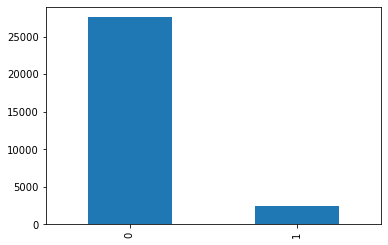

In [49]:
# Visualizing the churn variable
telecom_data['churn'].value_counts().plot(kind='bar')

In [50]:
# Checking the churn variable
telecom_data[['total_ic_mou_9','total_og_mou_9','vol_2g_mb_9','vol_3g_mb_9','churn']].head()

,total_ic_mou_9,total_og_mou_9,vol_2g_mb_9,vol_3g_mb_9,churn
0,0.00,0.00,0.00,0.00,1
1,0.00,0.00,0.00,0.00,1
2,34.91,142.18,0.00,0.00,0
3,252.61,1031.53,0.00,0.00,0
4,127.48,127.63,13.93,314.74,0


In [51]:
# selecting the columns related to the churn phase

column = list(telecom_data.columns)
columns_to_churn=[]
for c in column:
  if c[-1]=='9':
    columns_to_churn.append(c)
  else:
    pass

columns_to_churn

['arpu_9',
 'onnet_mou_9',
 'offnet_mou_9',
 'roam_ic_mou_9',
 'roam_og_mou_9',
 'loc_og_t2t_mou_9',
 'loc_og_t2m_mou_9',
 'loc_og_t2f_mou_9',
 'loc_og_t2c_mou_9',
 'loc_og_mou_9',
 'std_og_t2t_mou_9',
 'std_og_t2m_mou_9',
 'std_og_t2f_mou_9',
 'std_og_mou_9',
 'isd_og_mou_9',
 'spl_og_mou_9',
 'og_others_9',
 'total_og_mou_9',
 'loc_ic_t2t_mou_9',
 'loc_ic_t2m_mou_9',
 'loc_ic_t2f_mou_9',
 'loc_ic_mou_9',
 'std_ic_t2t_mou_9',
 'std_ic_t2m_mou_9',
 'std_ic_t2f_mou_9',
 'std_ic_mou_9',
 'total_ic_mou_9',
 'spl_ic_mou_9',
 'isd_ic_mou_9',
 'ic_others_9',
 'total_rech_num_9',
 'total_rech_amt_9',
 'max_rech_amt_9',
 'date_of_last_rech_9',
 'last_day_rch_amt_9',
 'date_of_last_rech_data_9',
 'total_rech_data_9',
 'max_rech_data_9',
 'av_rech_amt_data_9',
 'vol_2g_mb_9',
 'vol_3g_mb_9',
 'monthly_2g_9',
 'sachet_2g_9',
 'monthly_3g_9',
 'sachet_3g_9',
 'total_rech_amt_data_9',
 'overall_rech_amt_9']

In [52]:
# dropping all the selected columns relating to Churn phase

telecom_data.drop(columns_to_churn, inplace=True, axis=1)

In [53]:
# Checing the total number of rows likely to churn
telecom_data['churn'].sum()

2441

### Deriving new columns to understand the data better

In [54]:
# deriving columns with respect to service usage

# selecting columns based on local calls in month 6,7,8
column=telecom_data.columns
all_loc_mou=[]
for c in column:
  if c.startswith("loc"):
    all_loc_mou.append(c)
  else:
    pass

all_loc_mou

['loc_og_t2t_mou_6',
 'loc_og_t2t_mou_7',
 'loc_og_t2t_mou_8',
 'loc_og_t2m_mou_6',
 'loc_og_t2m_mou_7',
 'loc_og_t2m_mou_8',
 'loc_og_t2f_mou_6',
 'loc_og_t2f_mou_7',
 'loc_og_t2f_mou_8',
 'loc_og_t2c_mou_6',
 'loc_og_t2c_mou_7',
 'loc_og_t2c_mou_8',
 'loc_og_mou_6',
 'loc_og_mou_7',
 'loc_og_mou_8',
 'loc_ic_t2t_mou_6',
 'loc_ic_t2t_mou_7',
 'loc_ic_t2t_mou_8',
 'loc_ic_t2m_mou_6',
 'loc_ic_t2m_mou_7',
 'loc_ic_t2m_mou_8',
 'loc_ic_t2f_mou_6',
 'loc_ic_t2f_mou_7',
 'loc_ic_t2f_mou_8',
 'loc_ic_mou_6',
 'loc_ic_mou_7',
 'loc_ic_mou_8']

In [55]:
# Creating the mou for all loc calls
telecom_data['total_loc_mou'] = telecom_data[all_loc_mou].sum(axis=1)
telecom_data['total_loc_mou'].head()

0    383.06 
1    4365.95
2    1707.83
3    1385.92
4    1943.61
Name: total_loc_mou, dtype: float64

In [56]:
# selecting columns based on std calls in month 6,7,8
all_std_mou=[]
for c in column:
  if c.startswith('std'):
    all_std_mou.append(c)
  else:
    pass

all_std_mou

['std_og_t2t_mou_6',
 'std_og_t2t_mou_7',
 'std_og_t2t_mou_8',
 'std_og_t2m_mou_6',
 'std_og_t2m_mou_7',
 'std_og_t2m_mou_8',
 'std_og_t2f_mou_6',
 'std_og_t2f_mou_7',
 'std_og_t2f_mou_8',
 'std_og_mou_6',
 'std_og_mou_7',
 'std_og_mou_8',
 'std_ic_t2t_mou_6',
 'std_ic_t2t_mou_7',
 'std_ic_t2t_mou_8',
 'std_ic_t2m_mou_6',
 'std_ic_t2m_mou_7',
 'std_ic_t2m_mou_8',
 'std_ic_t2f_mou_6',
 'std_ic_t2f_mou_7',
 'std_ic_t2f_mou_8',
 'std_ic_mou_6',
 'std_ic_mou_7',
 'std_ic_mou_8']

In [57]:
# Creating the mou for all std calls
telecom_data['total_std_mou'] = telecom_data[all_std_mou].sum(axis=1)
telecom_data['total_std_mou'].head()

0    12.313333  
1    1522.720000
2    799.690000 
3    5729.300000
4    246.880000 
Name: total_std_mou, dtype: float64

In [58]:
# selecting columns based on isd calls in month 6,7,8
all_isd_mou=[]
for c in column:
  if c.startswith('isd'):
    all_isd_mou.append(c)
  else:
    pass

all_isd_mou

['isd_og_mou_6',
 'isd_og_mou_7',
 'isd_og_mou_8',
 'isd_ic_mou_6',
 'isd_ic_mou_7',
 'isd_ic_mou_8']

In [59]:
# Creating the mou for all isd calls
telecom_data['total_isd_mou'] = telecom_data[all_isd_mou].sum(axis=1)
telecom_data['total_isd_mou'].head()

0    0.00 
1    58.37
2    0.00 
3    0.00 
4    31.98
Name: total_isd_mou, dtype: float64

In [60]:
#Handling Date variables
telecom_data['date_of_last_rech_6'] = pd.to_datetime(telecom_data['date_of_last_rech_6'],  errors = 'coerce')
telecom_data['date_of_last_rech_7'] = pd.to_datetime(telecom_data['date_of_last_rech_7'],  errors = 'coerce')
telecom_data['date_of_last_rech_8'] = pd.to_datetime(telecom_data['date_of_last_rech_8'],  errors = 'coerce')

telecom_data['date_of_last_rech_data_6'] = pd.to_datetime(telecom_data['date_of_last_rech_data_6'], errors = 'coerce')
telecom_data['date_of_last_rech_data_7'] = pd.to_datetime(telecom_data['date_of_last_rech_data_7'],  errors = 'coerce')
telecom_data['date_of_last_rech_data_8'] = pd.to_datetime(telecom_data['date_of_last_rech_data_8'],  errors = 'coerce')

telecom_data['date_of_last_rech_6_day'] = telecom_data['date_of_last_rech_6'].dt.day
telecom_data['date_of_last_rech_6_yr'] = telecom_data['date_of_last_rech_6'].dt.year
telecom_data['date_of_last_rech_data_6_day'] = telecom_data['date_of_last_rech_data_6'].dt.day
telecom_data['date_of_last_rech_data_6_yr'] = telecom_data['date_of_last_rech_data_6'].dt.year

telecom_data['date_of_last_rech_7_day'] = telecom_data['date_of_last_rech_7'].dt.day
telecom_data['date_of_last_rech_7_yr'] = telecom_data['date_of_last_rech_7'].dt.year
telecom_data['date_of_last_rech_data_7_day'] = telecom_data['date_of_last_rech_data_7'].dt.day
telecom_data['date_of_last_rech_data_7_yr'] = telecom_data['date_of_last_rech_data_7'].dt.year

telecom_data['date_of_last_rech_8_day'] = telecom_data['date_of_last_rech_8'].dt.day
telecom_data['date_of_last_rech_8_yr'] = telecom_data['date_of_last_rech_8'].dt.year
telecom_data['date_of_last_rech_data_8_day'] = telecom_data['date_of_last_rech_data_8'].dt.day
telecom_data['date_of_last_rech_data_8_yr'] = telecom_data['date_of_last_rech_data_8'].dt.year

In [61]:
# Handling miss represented data under date columns
for i in range(len(telecom_data)):
  # For month 6
  if telecom_data['date_of_last_rech_6_yr'][i] == 1970 :
    telecom_data['date_of_last_rech_6_day'][i]=0
  if telecom_data['date_of_last_rech_data_6_yr'][i] == 1970 :
    telecom_data['date_of_last_rech_data_6_day'][i]=0

  # for month 7
  if telecom_data['date_of_last_rech_7_yr'][i] == 1970 :
    telecom_data['date_of_last_rech_7_day'][i]=0
  if telecom_data['date_of_last_rech_data_7_yr'][i] == 1970 :
    telecom_data['date_of_last_rech_data_7_day'][i]=0

  # for month 8
  if telecom_data['date_of_last_rech_8_yr'][i] == 1970 :
    telecom_data['date_of_last_rech_8_day'][i]=0
  if telecom_data['date_of_last_rech_data_8_yr'][i] == 1970 :
    telecom_data['date_of_last_rech_data_8_day'][i]=0

In [62]:
# Viewing the created columns
telecom_data[['date_of_last_rech_6_yr','date_of_last_rech_6_day',
              'date_of_last_rech_data_6_yr','date_of_last_rech_data_6_day']].head()

,date_of_last_rech_6_yr,date_of_last_rech_6_day,date_of_last_rech_data_6_yr,date_of_last_rech_data_6_day
0,2014,21,2014,21
1,2014,27,1970,0
2,2014,25,1970,0
3,2014,30,1970,0
4,2014,18,1970,0


In [63]:
# Dropping the unwanted date columns
telecom_data.drop(['date_of_last_rech_6_yr','date_of_last_rech_6',
              'date_of_last_rech_data_6_yr','date_of_last_rech_data_6',
              'date_of_last_rech_7_yr','date_of_last_rech_7',
              'date_of_last_rech_data_7_yr','date_of_last_rech_data_7',
              'date_of_last_rech_8_yr','date_of_last_rech_8',
              'date_of_last_rech_data_8_yr','date_of_last_rech_data_8'], inplace=True, axis=1)

In [64]:
telecom_data.shape

(30001, 151)

### Creating Categorical Columns and EDA

We can consider the columns having the count values of the relating to specified column names and convert them into categories which helps us understand the data better.

In [65]:
# Checking he unique values for all columns
telecom_data.nunique().sort_values(ascending=True)

churn                           2    
monthly_2g_6                    5    
monthly_2g_7                    6    
monthly_2g_8                    6    
monthly_3g_8                    12   
monthly_3g_6                    12   
monthly_3g_7                    15   
sachet_3g_6                     25   
sachet_3g_7                     27   
sachet_3g_8                     29   
date_of_last_rech_data_6_day    31   
date_of_last_rech_6_day         31   
sachet_2g_6                     31   
date_of_last_rech_8_day         32   
date_of_last_rech_data_8_day    32   
date_of_last_rech_7_day         32   
date_of_last_rech_data_7_day    32   
sachet_2g_8                     34   
sachet_2g_7                     35   
total_rech_data_6               38   
total_rech_data_7               43   
total_rech_data_8               47   
max_rech_data_6                 48   
max_rech_data_8                 49   
max_rech_data_7                 49   
total_rech_num_8                96   
total_rech_n

In [66]:
telecom_data['monthly_2g_group_6']=pd.cut(telecom_data['monthly_2g_6'],[-1,0,3,100],labels=["No_Recharge","<=3_Recharges",">3_Recharges"])
telecom_data['monthly_2g_group_7']=pd.cut(telecom_data['monthly_2g_7'],[-1,0,3,100],labels=["No_Recharge","<=3_Recharges",">3_Recharges"])
telecom_data['monthly_2g_group_8']=pd.cut(telecom_data['monthly_2g_8'],[-1,0,3,100],labels=["No_Recharge","<=3_Recharges",">3_Recharges"])

telecom_data[['monthly_2g_6','monthly_2g_group_6','monthly_2g_7','monthly_2g_group_7','monthly_2g_8','monthly_2g_group_8']].head()

,monthly_2g_6,monthly_2g_group_6,monthly_2g_7,monthly_2g_group_7,monthly_2g_8,monthly_2g_group_8
0,0.0,No_Recharge,0.0,No_Recharge,0.0,No_Recharge
1,0.0,No_Recharge,0.0,No_Recharge,0.0,No_Recharge
2,0.0,No_Recharge,1.0,<=3_Recharges,0.0,No_Recharge
3,0.0,No_Recharge,0.0,No_Recharge,0.0,No_Recharge
4,0.0,No_Recharge,0.0,No_Recharge,0.0,No_Recharge


					Distribution of monthly_2g_6 variable
 No_Recharge      25394
<=3_Recharges    4600 
>3_Recharges     7    
Name: monthly_2g_group_6, dtype: int64


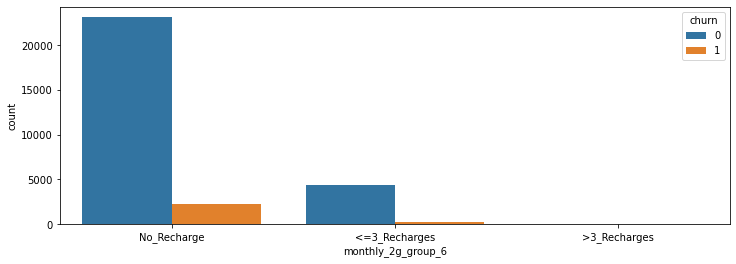




					Distribution of monthly_2g_7 variable
 No_Recharge      25241
<=3_Recharges    4720 
>3_Recharges     40   
Name: monthly_2g_group_7, dtype: int64


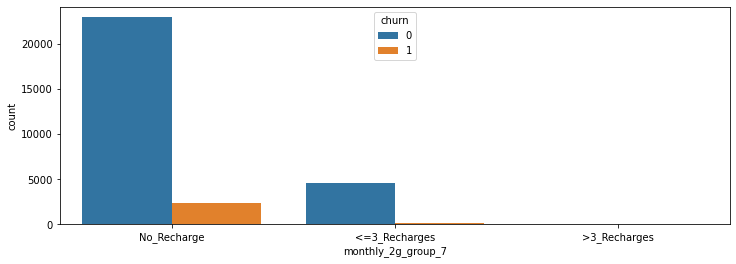




					Distribution of monthly_2g_8 variable
 No_Recharge      25854
<=3_Recharges    4107 
>3_Recharges     40   
Name: monthly_2g_group_8, dtype: int64


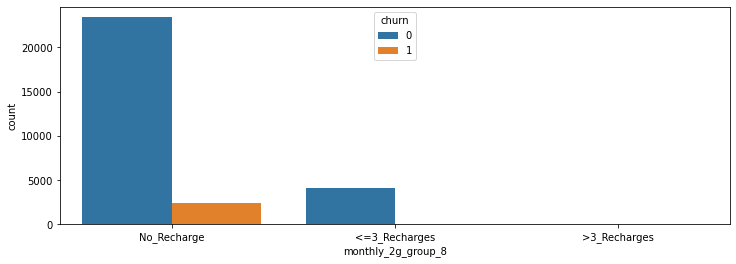

In [67]:
# Plotting the results

plt.figure(figsize=[12,4])
sns.countplot(data=telecom_data,x="monthly_2g_group_6",hue="churn")
print("\t\t\t\t\tDistribution of monthly_2g_6 variable\n",telecom_data['monthly_2g_group_6'].value_counts())
plt.show()
print("\n\n")
plt.figure(figsize=[12,4])
sns.countplot(data=telecom_data,x="monthly_2g_group_7",hue="churn")
print("\t\t\t\t\tDistribution of monthly_2g_7 variable\n",telecom_data['monthly_2g_group_7'].value_counts())
plt.show()
print("\n\n")
plt.figure(figsize=[12,4])
sns.countplot(data=telecom_data,x="monthly_2g_group_8",hue="churn")
print("\t\t\t\t\tDistribution of monthly_2g_8 variable\n",telecom_data['monthly_2g_group_8'].value_counts())
plt.show()

In [68]:
telecom_data['monthly_3g_6'].value_counts()

0.0     25342
1.0     3431 
2.0     852  
3.0     237  
4.0     76   
5.0     34   
6.0     12   
7.0     9    
8.0     3    
9.0     2    
11.0    2    
14.0    1    
Name: monthly_3g_6, dtype: int64

In [69]:
telecom_data['monthly_3g_group_6']=pd.cut(telecom_data['monthly_3g_6'],[-1,0,3,100],labels=["No_Recharge","<=3_Recharges",">3_Recharges"])
telecom_data['monthly_3g_group_7']=pd.cut(telecom_data['monthly_3g_7'],[-1,0,3,100],labels=["No_Recharge","<=3_Recharges",">3_Recharges"])
telecom_data['monthly_3g_group_8']=pd.cut(telecom_data['monthly_3g_8'],[-1,0,3,100],labels=["No_Recharge","<=3_Recharges",">3_Recharges"])

telecom_data[['monthly_3g_6','monthly_3g_group_6','monthly_3g_7','monthly_3g_group_7','monthly_3g_8','monthly_3g_group_8']].head()

,monthly_3g_6,monthly_3g_group_6,monthly_3g_7,monthly_3g_group_7,monthly_3g_8,monthly_3g_group_8
0,1.0,<=3_Recharges,1.0,<=3_Recharges,1.0,<=3_Recharges
1,0.0,No_Recharge,0.0,No_Recharge,0.0,No_Recharge
2,0.0,No_Recharge,0.0,No_Recharge,0.0,No_Recharge
3,0.0,No_Recharge,0.0,No_Recharge,0.0,No_Recharge
4,0.0,No_Recharge,2.0,<=3_Recharges,1.0,<=3_Recharges


					Distribution of monthly_3g_6 variable
 No_Recharge      25342
<=3_Recharges    4520 
>3_Recharges     139  
Name: monthly_3g_group_6, dtype: int64


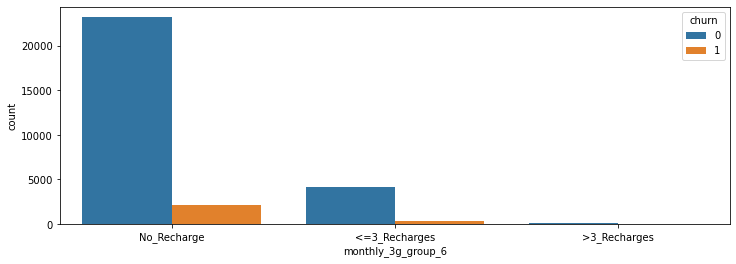




					Distribution of monthly_3g_7 variable
 No_Recharge      25306
<=3_Recharges    4528 
>3_Recharges     167  
Name: monthly_3g_group_7, dtype: int64


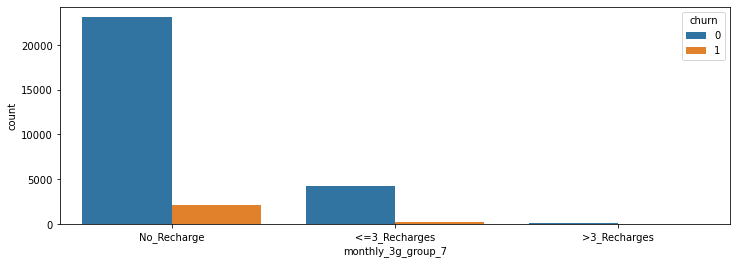


					Distribution of monthly_3g_8 variable
 No_Recharge      25605
<=3_Recharges    4241 
>3_Recharges     155  
Name: monthly_3g_group_8, dtype: int64


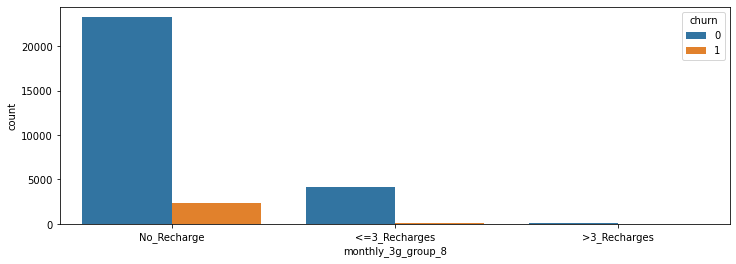

In [70]:
# Plotting the results

plt.figure(figsize=[12,4])
sns.countplot(data=telecom_data,x="monthly_3g_group_6",hue="churn")
print("\t\t\t\t\tDistribution of monthly_3g_6 variable\n",telecom_data['monthly_3g_group_6'].value_counts())
plt.show()
print("\n\n")
plt.figure(figsize=[12,4])
sns.countplot(data=telecom_data,x="monthly_3g_group_7",hue="churn")
print("\t\t\t\t\tDistribution of monthly_3g_7 variable\n",telecom_data['monthly_3g_group_7'].value_counts())
plt.show("\n\n")
print()
plt.figure(figsize=[12,4])
sns.countplot(data=telecom_data,x="monthly_3g_group_8",hue="churn")
print("\t\t\t\t\tDistribution of monthly_3g_8 variable\n",telecom_data['monthly_3g_group_8'].value_counts())
plt.show()

In [71]:
telecom_data['sachet_2g_6'].value_counts()

0.0     21256
1.0     3100 
2.0     1505 
3.0     940  
4.0     742  
5.0     516  
6.0     444  
7.0     339  
8.0     291  
9.0     229  
10.0    194  
11.0    119  
12.0    111  
13.0    53   
14.0    44   
15.0    28   
17.0    18   
16.0    16   
18.0    13   
19.0    13   
22.0    7    
20.0    6    
21.0    5    
24.0    3    
25.0    3    
39.0    1    
27.0    1    
34.0    1    
42.0    1    
30.0    1    
32.0    1    
Name: sachet_2g_6, dtype: int64

In [72]:
telecom_data['sachet_2g_group_6']=pd.cut(telecom_data['sachet_2g_6'],[-1,0,10,100],labels=["No_Recharge","<=10_Recharges",">10_Recharges"])
telecom_data['sachet_2g_group_7']=pd.cut(telecom_data['sachet_2g_7'],[-1,0,10,100],labels=["No_Recharge","<=10_Recharges",">10_Recharges"])
telecom_data['sachet_2g_group_8']=pd.cut(telecom_data['sachet_2g_8'],[-1,0,10,100],labels=["No_Recharge","<=10_Recharges",">10_Recharges"])

telecom_data['sachet_3g_group_6']=pd.cut(telecom_data['sachet_3g_6'],[-1,0,10,100],labels=["No_Recharge","<=10_Recharges",">10_Recharges"])
telecom_data['sachet_3g_group_7']=pd.cut(telecom_data['sachet_3g_7'],[-1,0,10,100],labels=["No_Recharge","<=10_Recharges",">10_Recharges"])
telecom_data['sachet_3g_group_8']=pd.cut(telecom_data['sachet_3g_8'],[-1,0,10,100],labels=["No_Recharge","<=10_Recharges",">10_Recharges"])

telecom_data[['sachet_2g_6','sachet_2g_group_6','sachet_2g_7','sachet_2g_group_7','sachet_2g_8','sachet_2g_group_8',
              'sachet_3g_6','sachet_3g_group_6','sachet_3g_7','sachet_3g_group_7','sachet_3g_8','sachet_3g_group_8']].head()

,sachet_2g_6,sachet_2g_group_6,sachet_2g_7,sachet_2g_group_7,sachet_2g_8,sachet_2g_group_8,sachet_3g_6,sachet_3g_group_6,sachet_3g_7,sachet_3g_group_7,sachet_3g_8,sachet_3g_group_8
0,0.0,No_Recharge,0.0,No_Recharge,0.0,No_Recharge,0.0,No_Recharge,0.0,No_Recharge,0.0,No_Recharge
1,0.0,No_Recharge,0.0,No_Recharge,0.0,No_Recharge,0.0,No_Recharge,0.0,No_Recharge,0.0,No_Recharge
2,0.0,No_Recharge,1.0,<=10_Recharges,3.0,<=10_Recharges,0.0,No_Recharge,0.0,No_Recharge,0.0,No_Recharge
3,0.0,No_Recharge,0.0,No_Recharge,0.0,No_Recharge,0.0,No_Recharge,0.0,No_Recharge,0.0,No_Recharge
4,0.0,No_Recharge,0.0,No_Recharge,0.0,No_Recharge,0.0,No_Recharge,0.0,No_Recharge,1.0,<=10_Recharges


					Distribution of sachet_2g_6 variable
 No_Recharge       21256
<=10_Recharges    8300 
>10_Recharges     445  
Name: sachet_2g_group_6, dtype: int64


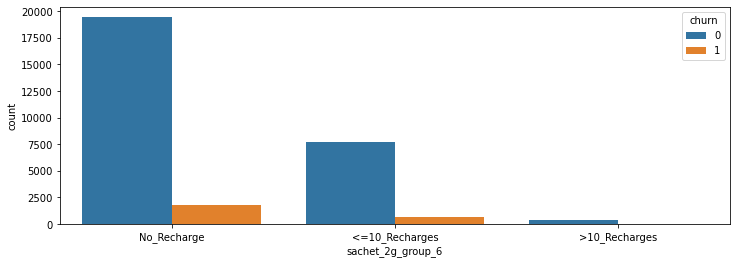




					Distribution of sachet_2g_7 variable
 No_Recharge       20986
<=10_Recharges    8466 
>10_Recharges     549  
Name: sachet_2g_group_7, dtype: int64


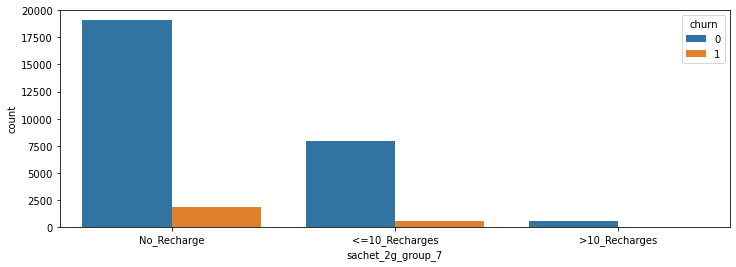


					Distribution of sachet_2g_8 variable
 No_Recharge       21451
<=10_Recharges    8077 
>10_Recharges     473  
Name: sachet_2g_group_8, dtype: int64


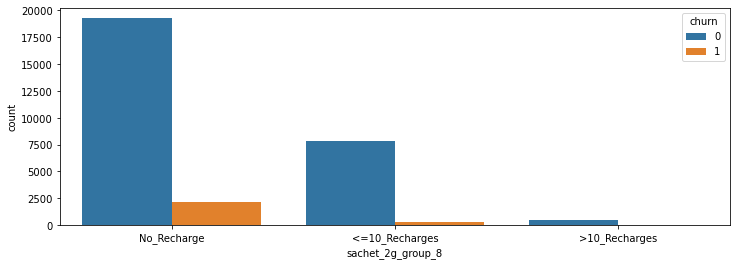

In [73]:
# Plotting the results

plt.figure(figsize=[12,4])
sns.countplot(data=telecom_data,x="sachet_2g_group_6",hue="churn")
print("\t\t\t\t\tDistribution of sachet_2g_6 variable\n",telecom_data['sachet_2g_group_6'].value_counts())
plt.show()
print("\n\n")
plt.figure(figsize=[12,4])
sns.countplot(data=telecom_data,x="sachet_2g_group_7",hue="churn")
print("\t\t\t\t\tDistribution of sachet_2g_7 variable\n",telecom_data['sachet_2g_group_7'].value_counts())
plt.show("\n\n")
print()
plt.figure(figsize=[12,4])
sns.countplot(data=telecom_data,x="sachet_2g_group_8",hue="churn")
print("\t\t\t\t\tDistribution of sachet_2g_8 variable\n",telecom_data['sachet_2g_group_8'].value_counts())
plt.show()

					Distribution of sachet_3g_6 variable
 No_Recharge       26768
<=10_Recharges    3187 
>10_Recharges     46   
Name: sachet_3g_group_6, dtype: int64


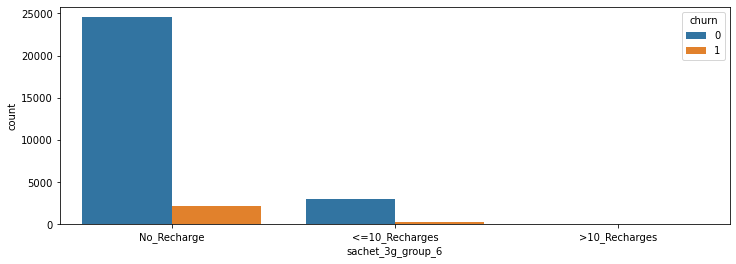




					Distribution of sachet_3g_7 variable
 No_Recharge       26807
<=10_Recharges    3125 
>10_Recharges     69   
Name: sachet_3g_group_7, dtype: int64


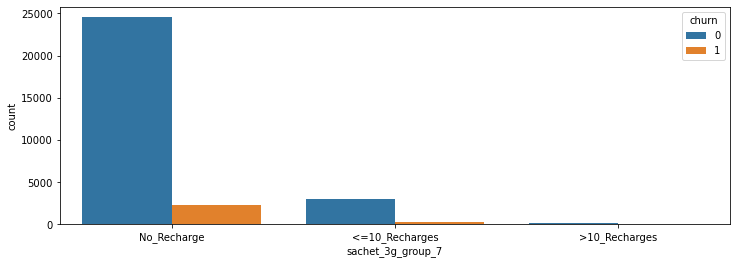


					Distribution of sachet_3g_8 variable
 No_Recharge       27341
<=10_Recharges    2594 
>10_Recharges     66   
Name: sachet_3g_group_8, dtype: int64


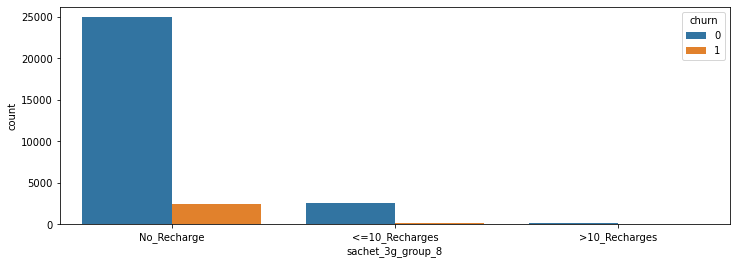

In [74]:
# Plotting the results

plt.figure(figsize=[12,4])
sns.countplot(data=telecom_data,x="sachet_3g_group_6",hue="churn")
print("\t\t\t\t\tDistribution of sachet_3g_6 variable\n",telecom_data['sachet_3g_group_6'].value_counts())
plt.show()
print("\n\n")
plt.figure(figsize=[12,4])
sns.countplot(data=telecom_data,x="sachet_3g_group_7",hue="churn")
print("\t\t\t\t\tDistribution of sachet_3g_7 variable\n",telecom_data['sachet_3g_group_7'].value_counts())
plt.show("\n\n")
print()
plt.figure(figsize=[12,4])
sns.countplot(data=telecom_data,x="sachet_3g_group_8",hue="churn")
print("\t\t\t\t\tDistribution of sachet_3g_8 variable\n",telecom_data['sachet_3g_group_8'].value_counts())
plt.show()

In [75]:
telecom_data['total_rech_num_6'].value_counts().sort_index(ascending=True)

0.0      73  
1.0      339 
2.0      696 
3.0      1212
4.0      1666
5.0      2060
6.0      2418
7.0      2336
8.0      2307
9.0      2126
10.0     1876
11.0     1647
12.0     1430
13.0     1192
14.0     1037
15.0     900 
16.0     795 
17.0     654 
18.0     572 
19.0     509 
20.0     420 
21.0     378 
22.0     355 
23.0     314 
24.0     277 
25.0     269 
26.0     206 
27.0     182 
28.0     168 
29.0     148 
30.0     132 
31.0     128 
32.0     119 
33.0     92  
34.0     78  
35.0     74  
36.0     88  
37.0     57  
38.0     52  
39.0     32  
40.0     44  
41.0     43  
42.0     41  
43.0     38  
44.0     35  
45.0     31  
46.0     28  
47.0     34  
48.0     19  
49.0     27  
50.0     16  
51.0     24  
52.0     17  
53.0     17  
54.0     10  
55.0     14  
56.0     10  
57.0     8   
58.0     14  
59.0     11  
60.0     4   
61.0     6   
62.0     5   
63.0     8   
64.0     2   
65.0     9   
66.0     5   
67.0     2   
68.0     4   
69.0     4   
70.0     4   
71.0  

In [76]:
telecom_data['total_rech_data_group_6']=pd.cut(telecom_data['total_rech_data_6'],[-1,0,10,25,100],labels=["No_Recharge","<=10_Recharges","10-25_Recharges",">25_Recharges"])
telecom_data['total_rech_data_group_7']=pd.cut(telecom_data['total_rech_data_7'],[-1,0,10,25,100],labels=["No_Recharge","<=10_Recharges","10-25_Recharges",">25_Recharges"])
telecom_data['total_rech_data_group_8']=pd.cut(telecom_data['total_rech_data_8'],[-1,0,10,25,100],labels=["No_Recharge","<=10_Recharges","10-25_Recharges",">25_Recharges"])

telecom_data['total_rech_num_group_6']=pd.cut(telecom_data['total_rech_num_6'],[-1,0,10,25,1000],labels=["No_Recharge","<=10_Recharges","10-25_Recharges",">25_Recharges"])
telecom_data['total_rech_num_group_7']=pd.cut(telecom_data['total_rech_num_7'],[-1,0,10,25,1000],labels=["No_Recharge","<=10_Recharges","10-25_Recharges",">25_Recharges"])
telecom_data['total_rech_num_group_8']=pd.cut(telecom_data['total_rech_num_8'],[-1,0,10,25,1000],labels=["No_Recharge","<=10_Recharges","10-25_Recharges",">25_Recharges"])

telecom_data[['total_rech_data_6','total_rech_data_group_6','total_rech_data_7','total_rech_data_group_7','total_rech_data_8','total_rech_data_group_8',
              'total_rech_num_6','total_rech_num_group_6','total_rech_num_7','total_rech_num_group_7','total_rech_num_8','total_rech_num_group_8']].head()

,total_rech_data_6,total_rech_data_group_6,total_rech_data_7,total_rech_data_group_7,total_rech_data_8,total_rech_data_group_8,total_rech_num_6,total_rech_num_group_6,total_rech_num_7,total_rech_num_group_7,total_rech_num_8,total_rech_num_group_8
0,1.0,<=10_Recharges,1.0,<=10_Recharges,1.0,<=10_Recharges,4.0,<=10_Recharges,3.0,<=10_Recharges,2.0,<=10_Recharges
1,0.0,No_Recharge,0.0,No_Recharge,0.0,No_Recharge,5.0,<=10_Recharges,5.0,<=10_Recharges,7.0,<=10_Recharges
2,0.0,No_Recharge,2.0,<=10_Recharges,3.0,<=10_Recharges,19.0,10-25_Recharges,21.0,10-25_Recharges,14.0,10-25_Recharges
3,0.0,No_Recharge,0.0,No_Recharge,0.0,No_Recharge,22.0,10-25_Recharges,26.0,>25_Recharges,27.0,>25_Recharges
4,0.0,No_Recharge,2.0,<=10_Recharges,2.0,<=10_Recharges,3.0,<=10_Recharges,5.0,<=10_Recharges,4.0,<=10_Recharges


					Distribution of total_rech_data_6 variable
 <=10_Recharges     16148
No_Recharge        13245
10-25_Recharges    587  
>25_Recharges      21   
Name: total_rech_data_group_6, dtype: int64


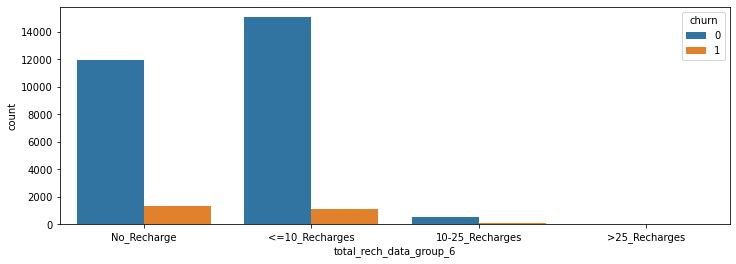




					Distribution of total_rech_data_6 variable
 <=10_Recharges     16318
No_Recharge        12944
10-25_Recharges    705  
>25_Recharges      34   
Name: total_rech_data_group_7, dtype: int64


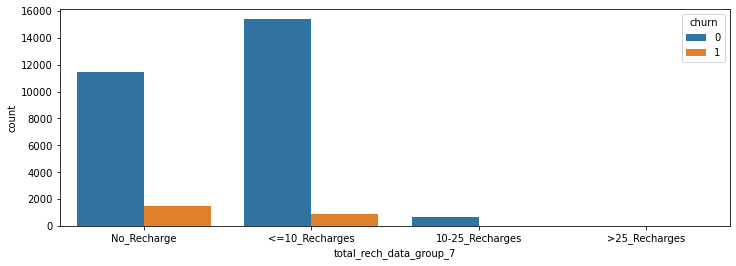


					Distribution of total_rech_data_6 variable
 <=10_Recharges     15307
No_Recharge        14048
10-25_Recharges    608  
>25_Recharges      38   
Name: total_rech_data_group_8, dtype: int64


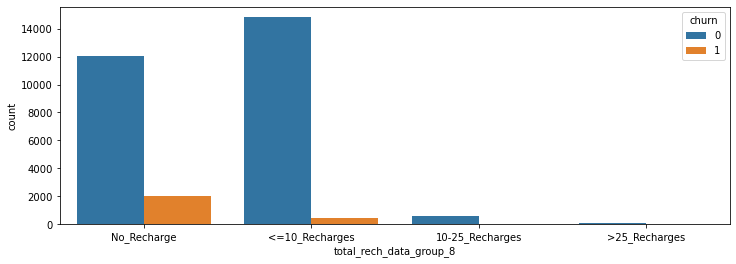

In [77]:
# Plotting the results

plt.figure(figsize=[12,4])
sns.countplot(data=telecom_data,x="total_rech_data_group_6",hue="churn")
print("\t\t\t\t\tDistribution of total_rech_data_6 variable\n",telecom_data['total_rech_data_group_6'].value_counts())
plt.show()
print("\n\n")
plt.figure(figsize=[12,4])
sns.countplot(data=telecom_data,x="total_rech_data_group_7",hue="churn")
print("\t\t\t\t\tDistribution of total_rech_data_6 variable\n",telecom_data['total_rech_data_group_7'].value_counts())
plt.show("\n\n")
print()
plt.figure(figsize=[12,4])
sns.countplot(data=telecom_data,x="total_rech_data_group_8",hue="churn")
print("\t\t\t\t\tDistribution of total_rech_data_6 variable\n",telecom_data['total_rech_data_group_8'].value_counts())
plt.show()

					Distribution of total_rech_num_6 variable
 <=10_Recharges     17036
10-25_Recharges    10749
>25_Recharges      2143 
No_Recharge        73   
Name: total_rech_num_group_6, dtype: int64


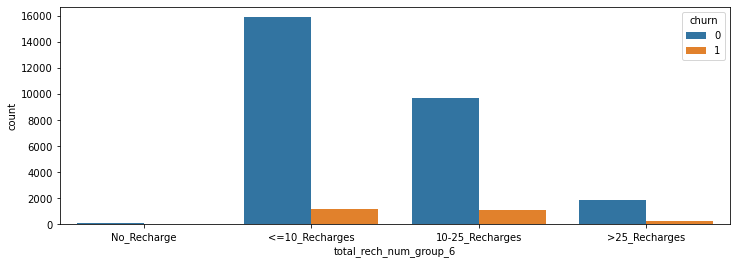




					Distribution of total_rech_num_7 variable
 <=10_Recharges     17334
10-25_Recharges    10383
>25_Recharges      2186 
No_Recharge        98   
Name: total_rech_num_group_7, dtype: int64


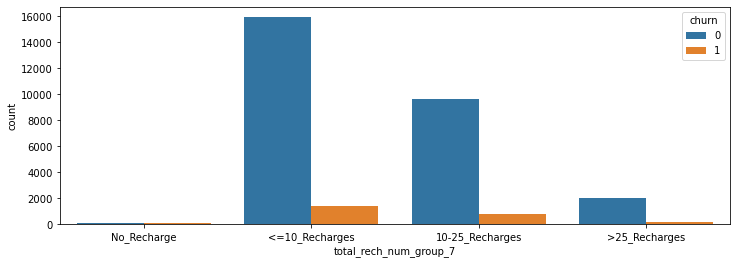


					Distribution of total_rech_num_8 variable
 <=10_Recharges     19349
10-25_Recharges    8073 
>25_Recharges      1996 
No_Recharge        583  
Name: total_rech_num_group_8, dtype: int64


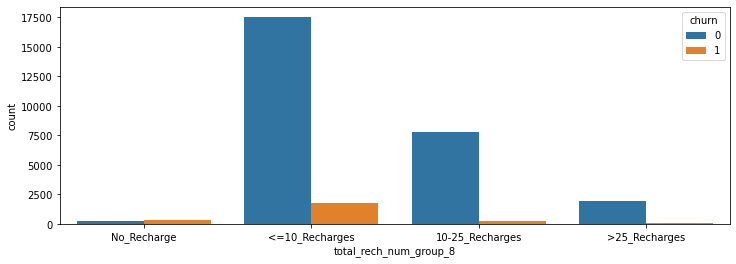

In [78]:
# Plotting the results

plt.figure(figsize=[12,4])
sns.countplot(data=telecom_data,x="total_rech_num_group_6",hue="churn")
print("\t\t\t\t\tDistribution of total_rech_num_6 variable\n",telecom_data['total_rech_num_group_6'].value_counts())
plt.show()
print("\n\n")
plt.figure(figsize=[12,4])
sns.countplot(data=telecom_data,x="total_rech_num_group_7",hue="churn")
print("\t\t\t\t\tDistribution of total_rech_num_7 variable\n",telecom_data['total_rech_num_group_7'].value_counts())
plt.show("\n\n")
print()
plt.figure(figsize=[12,4])
sns.countplot(data=telecom_data,x="total_rech_num_group_8",hue="churn")
print("\t\t\t\t\tDistribution of total_rech_num_8 variable\n",telecom_data['total_rech_num_group_8'].value_counts())
plt.show()

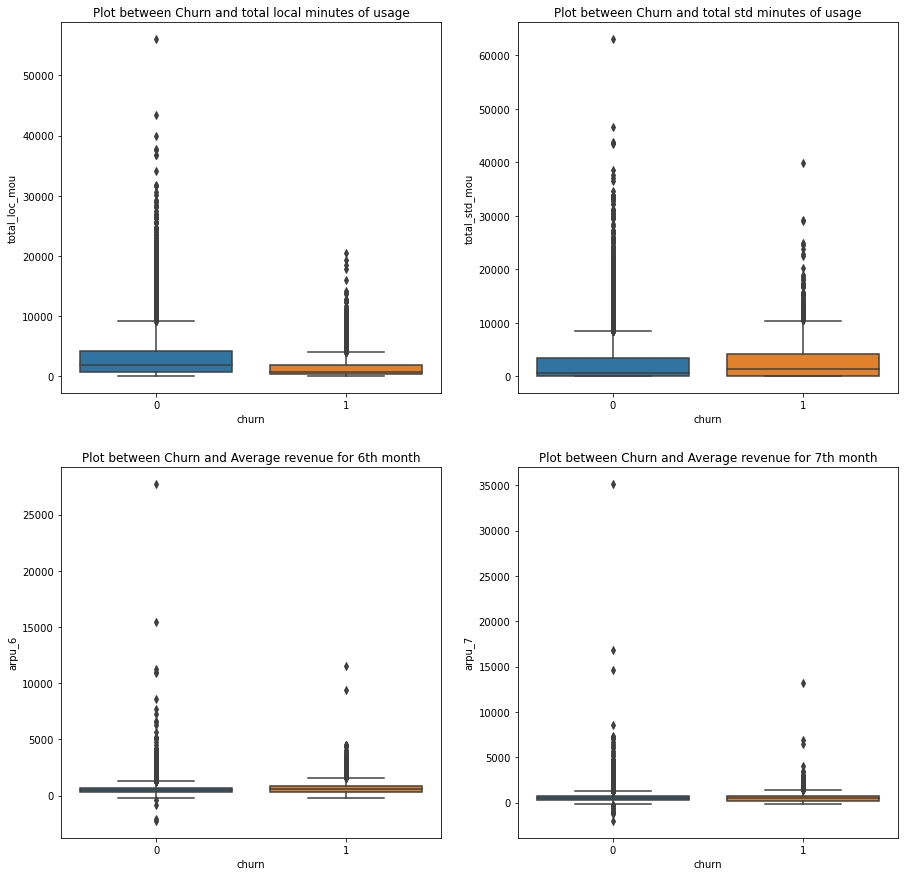

In [85]:
# Visualizing the churn variable with various predictor variables

#Plotting different varaible against churn
plt.figure(figsize=(15, 15))
plt.subplot(2,2,1)
sns.boxplot(x = 'churn', y = 'total_loc_mou', data = telecom_data)
plt.title("Plot between Churn and total local minutes of usage")
plt.subplot(2,2,2)
sns.boxplot(x = 'churn', y = 'total_std_mou', data = telecom_data)
plt.title("Plot between Churn and total std minutes of usage")
plt.subplot(2,2,3)
sns.boxplot(x = 'churn', y = 'arpu_6', data = telecom_data)
plt.title("Plot between Churn and Average revenue for 6th month")
plt.subplot(2,2,4)
sns.boxplot(x = 'churn', y = 'arpu_7', data = telecom_data)
plt.title("Plot between Churn and Average revenue for 7th month")
plt.show()

In [108]:
telecom_data['arpu_6'].describe().quantile([0.25,0.50,0.75,0.90,0.95,0.99,1])

0.25    422.946596  
0.50    520.092412  
0.75    7457.729250 
0.90    28412.061600
0.95    29206.530800
0.99    29842.106160
1.00    30001.000000
Name: arpu_6, dtype: float64

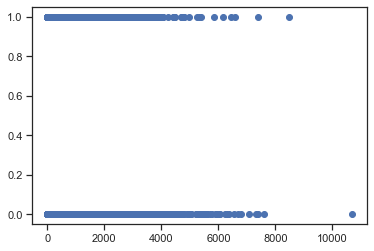

In [110]:
plt.scatter(x='total_og_mou_6',y='churn',data=telecom_data)

In [ ]:
# # Treating the Outliers in the data

# Q1 = telecom_data.total_loc_mou.quantile(0.25)
# Q3 = telecom_data.total_loc_mou.quantile(0.75)
# IQR = Q3-Q1

# Lower_wishker = Q1-1.5*IQR
# Upper_whisker = Q3+1.5*IQR

# telecom_data = telecom_data[telecom_data.total_loc_mou < Upper_whisker]

# sns.boxplot(x = 'churn', y = 'total_loc_mou', data = telecom_data)
# plt.show()

In [86]:
 num_col = telecom_data.select_dtypes(include = ['int64','float64']).columns.tolist()

In [88]:
telecom_data[num_col].describe().T

,count,mean,std,min,25%,50%,75%,max
arpu_6,30001.0,558.490824,460.640461,-2258.709,309.865000,481.694000,699.943,27731.088
arpu_7,30001.0,560.782203,479.776947,-2014.045,309.826000,480.943000,698.315,35145.834
arpu_8,30001.0,508.597957,501.961981,-945.808,231.473000,427.585000,661.491,33543.624
onnet_mou_6,30001.0,261.763594,459.882419,0.000,18.210000,85.590000,290.980,7376.710
onnet_mou_7,30001.0,268.260706,479.811532,0.000,16.930000,83.410000,290.430,8157.780
onnet_mou_8,30001.0,235.274934,458.092626,0.000,12.480000,66.940000,241.360,10752.560
offnet_mou_6,30001.0,375.137397,481.779788,0.000,74.080000,223.680000,488.330,8362.360
offnet_mou_7,30001.0,379.147087,498.294373,0.000,71.660000,220.560000,494.030,9667.130
offnet_mou_8,30001.0,337.446774,481.002109,0.000,51.990000,184.280000,439.210,14007.340
roam_ic_mou_6,30001.0,16.321971,76.565422,0.000,0.000000,0.000000,0.000,2613.310


Text(0.5, 1.0, 'Features Correlating with Churn variable')

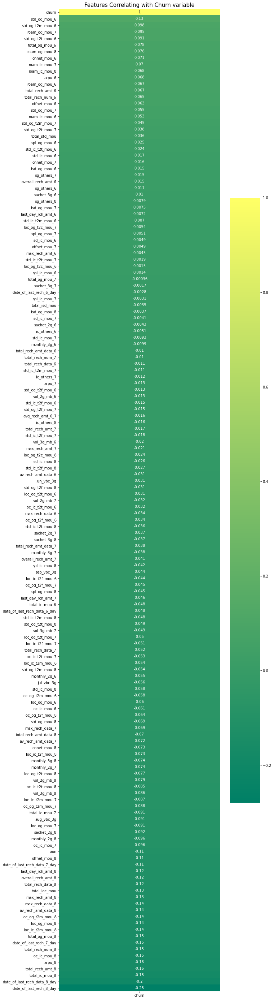

In [92]:
# Checking Correlation between target variable(SalePrice) with the other variable in the dataset
plt.figure(figsize=(10,50))
heatmap_churn = sns.heatmap(telecom_data.corr()[['churn']].sort_values(ascending=False, by='churn'),annot=True, 
                                cmap='summer')
heatmap_churn.set_title("Features Correlating with Churn variable", fontsize=15)

- Here we can see that more number of variables are not positively correlated and more variables are negatively correlated to the target variable.

<AxesSubplot:>

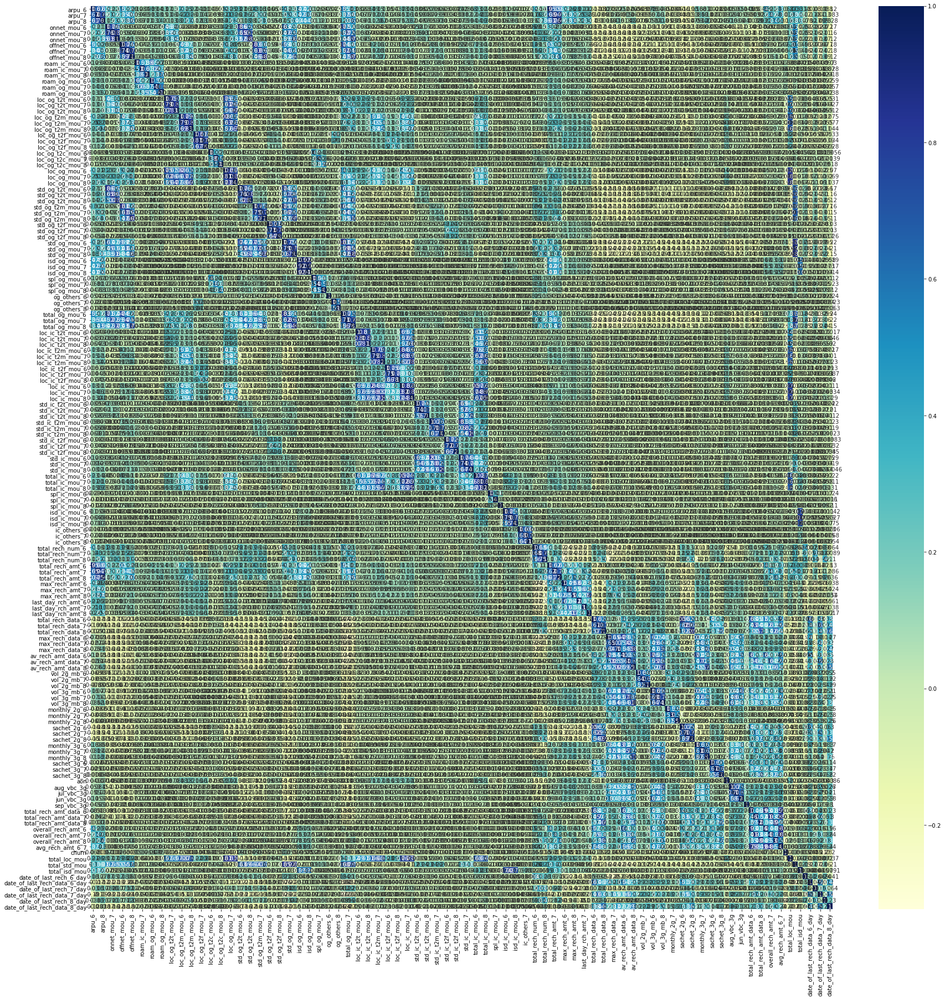

In [93]:
# Heatmap of all the numerical variables in the dataset
plt.figure(figsize = (30,30))
sns.heatmap(telecom_data[num_col].corr(), annot=True, cmap='YlGnBu')

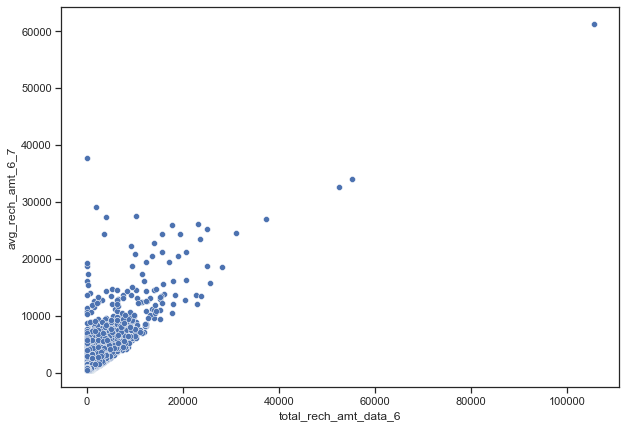

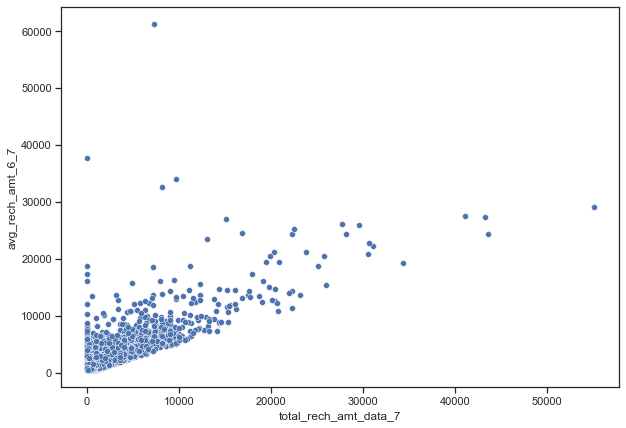

In [103]:
plt.figure(figsize = (10,7))
sns.scatterplot(data=telecom_data, y='avg_rech_amt_6_7', x= 'total_rech_amt_data_6')
plt.show()
plt.figure(figsize = (10,7))
sns.scatterplot(data=telecom_data, y='avg_rech_amt_6_7', x= 'total_rech_amt_data_7')
plt.show()

<Figure size 720x504 with 0 Axes>

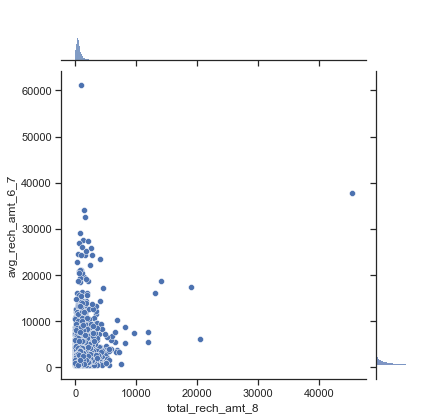

<Figure size 720x504 with 0 Axes>

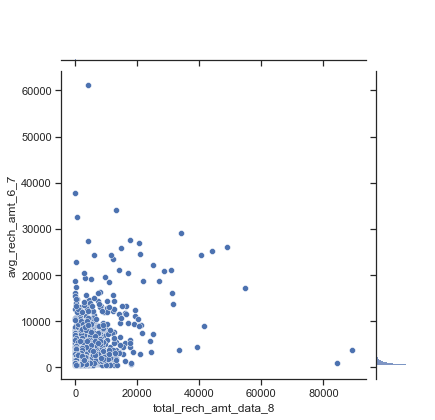

In [105]:
plt.figure(figsize = (10,7))
sns.jointplot(data=telecom_data, y='avg_rech_amt_6_7', x= 'total_rech_amt_8')
plt.show()
plt.figure(figsize = (10,7))
sns.jointplot(data=telecom_data, y='avg_rech_amt_6_7', x= 'total_rech_amt_data_8')
plt.show()

(array([2.3417e+04, 6.5490e+03, 2.5000e+01, 4.0000e+00, 4.0000e+00,
        1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 1.0000e+00]),
 array([-2258.709 ,   740.2707,  3739.2504,  6738.2301,  9737.2098,
        12736.1895, 15735.1692, 18734.1489, 21733.1286, 24732.1083,
        27731.088 ]),
 <BarContainer object of 10 artists>)

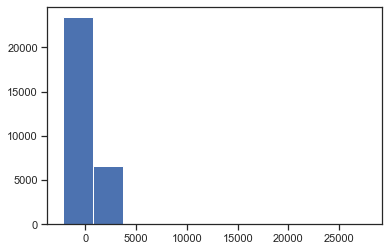

In [104]:
plt.hist(telecom_data['arpu_6'])

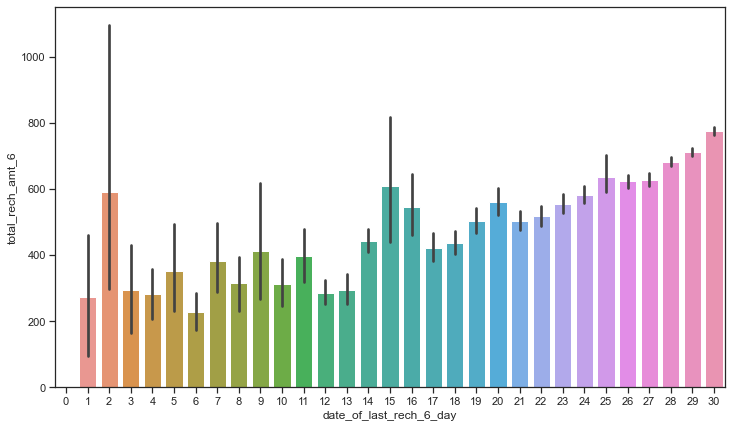

In [113]:
plt.figure(figsize=[12,7])
sns.barplot(x='date_of_last_rech_6_day', y='total_rech_amt_6',data=telecom_data)
plt.show()

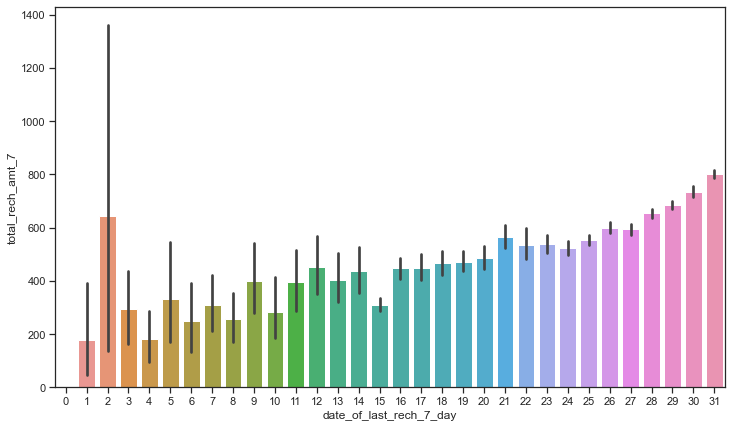

In [114]:
plt.figure(figsize=[12,7])
sns.barplot(x='date_of_last_rech_7_day', y='total_rech_amt_7',data=telecom_data)
plt.show()

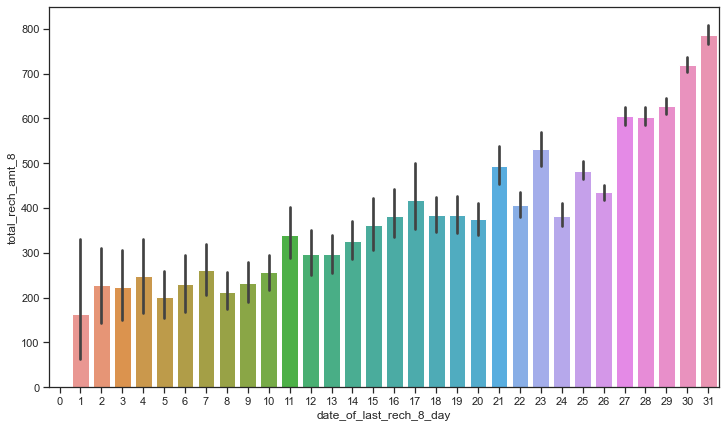

In [118]:
plt.figure(figsize=[12,7])
sns.barplot(x='date_of_last_rech_8_day', y='total_rech_amt_8',data=telecom_data)
plt.show()

In [124]:
telecom_data['user_tenure'] = (telecom_data['aon']/30).round(0)

In [133]:
telecom_data['user_tenure'].value_counts().sort_index(ascending=True)

6.0      515 
7.0      879 
8.0      817 
9.0      815 
10.0     877 
11.0     802 
12.0     892 
13.0     675 
14.0     590 
15.0     747 
16.0     1418
17.0     630 
18.0     545 
19.0     497 
20.0     506 
21.0     528 
22.0     565 
23.0     465 
24.0     623 
25.0     441 
26.0     436 
27.0     432 
28.0     419 
29.0     385 
30.0     340 
31.0     360 
32.0     372 
33.0     296 
34.0     356 
35.0     319 
36.0     363 
37.0     299 
38.0     294 
39.0     246 
40.0     279 
41.0     252 
42.0     234 
43.0     244 
44.0     240 
45.0     233 
46.0     239 
47.0     195 
48.0     214 
49.0     175 
50.0     176 
51.0     190 
52.0     193 
53.0     141 
54.0     119 
55.0     126 
56.0     196 
57.0     176 
58.0     134 
59.0     109 
60.0     153 
61.0     111 
62.0     94  
63.0     79  
64.0     99  
65.0     103 
66.0     150 
67.0     106 
68.0     114 
69.0     76  
70.0     101 
71.0     76  
72.0     71  
73.0     60  
74.0     94  
75.0     128 
76.0     146 
77.0  

In [136]:
telecom_data['tenure_in_years']=pd.cut(telecom_data['user_tenure'],[0,11,35,59,119,180],labels=["less_than_1_year","1-3_years","3-5_years","5-10_years","more_than_10_years"])


In [137]:
telecom_data[['user_tenure','tenure_in_years']]

,user_tenure,tenure_in_years
0,32.0,1-3_years
1,27.0,1-3_years
2,10.0,less_than_1_year
3,24.0,1-3_years
4,20.0,1-3_years
5,44.0,3-5_years
6,38.0,3-5_years
7,67.0,5-10_years
8,42.0,3-5_years
9,23.0,1-3_years


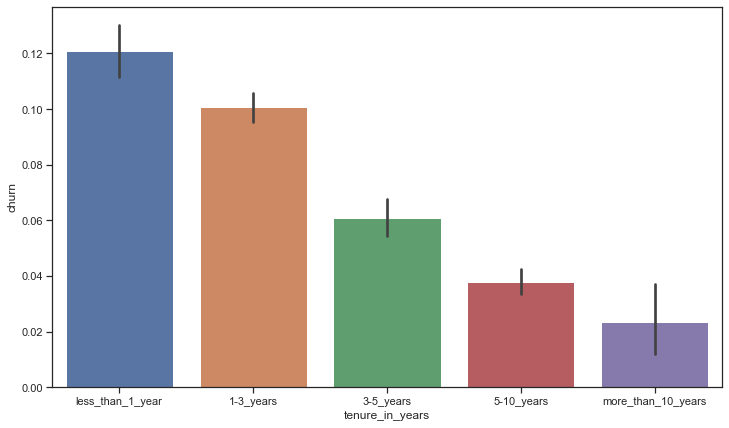

In [148]:
plt.figure(figsize=[12,7])
sns.barplot(x='tenure_in_years',y='churn', data=telecom_data)

plt.show()

<AxesSubplot:xlabel='user_tenure', ylabel='Density'>

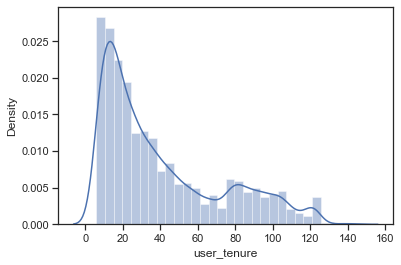

In [149]:
sns.distplot(telecom_data['user_tenure'],bins=30)

### Outlier Treatments

##### From the previous plots we can identify that there are many outliers present in the data, which are bad for a machine model

Hence we can transform the columns in order to reduce the outlier by doing log transformation

#### Data Transformation

In [154]:
num_col = telecom_data.select_dtypes(include = ['int64','float64']).columns.tolist()
num_col.remove('churn')

In [155]:
num_col

['arpu_6',
 'arpu_7',
 'arpu_8',
 'onnet_mou_6',
 'onnet_mou_7',
 'onnet_mou_8',
 'offnet_mou_6',
 'offnet_mou_7',
 'offnet_mou_8',
 'roam_ic_mou_6',
 'roam_ic_mou_7',
 'roam_ic_mou_8',
 'roam_og_mou_6',
 'roam_og_mou_7',
 'roam_og_mou_8',
 'loc_og_t2t_mou_6',
 'loc_og_t2t_mou_7',
 'loc_og_t2t_mou_8',
 'loc_og_t2m_mou_6',
 'loc_og_t2m_mou_7',
 'loc_og_t2m_mou_8',
 'loc_og_t2f_mou_6',
 'loc_og_t2f_mou_7',
 'loc_og_t2f_mou_8',
 'loc_og_t2c_mou_6',
 'loc_og_t2c_mou_7',
 'loc_og_t2c_mou_8',
 'loc_og_mou_6',
 'loc_og_mou_7',
 'loc_og_mou_8',
 'std_og_t2t_mou_6',
 'std_og_t2t_mou_7',
 'std_og_t2t_mou_8',
 'std_og_t2m_mou_6',
 'std_og_t2m_mou_7',
 'std_og_t2m_mou_8',
 'std_og_t2f_mou_6',
 'std_og_t2f_mou_7',
 'std_og_t2f_mou_8',
 'std_og_mou_6',
 'std_og_mou_7',
 'std_og_mou_8',
 'isd_og_mou_6',
 'isd_og_mou_7',
 'isd_og_mou_8',
 'spl_og_mou_6',
 'spl_og_mou_7',
 'spl_og_mou_8',
 'og_others_6',
 'og_others_7',
 'og_others_8',
 'total_og_mou_6',
 'total_og_mou_7',
 'total_og_mou_8',
 'loc_ic_t

In [166]:
# telecom_data[num_col] = np.log(telecom_data[num_col])

<AxesSubplot:xlabel='user_tenure', ylabel='Density'>

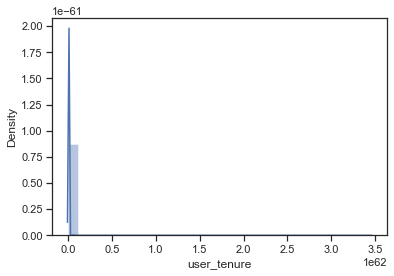

In [164]:
# sns.distplot(telecom_data['user_tenure'],bins=30)

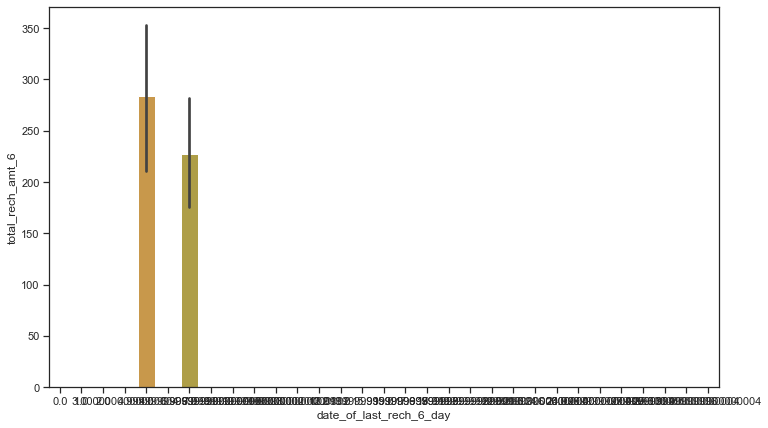

In [167]:
# plt.figure(figsize=[12,7])
# sns.barplot(x='date_of_last_rech_6_day', y='total_rech_amt_6',data=telecom_data)
# plt.show()

In [168]:
telecom_data['date_of_last_rech_6_day'].head()

0    21.0
1    27.0
2    25.0
3    30.0
4    18.0
Name: date_of_last_rech_6_day, dtype: float64